# 웹 로그 기반 조회수 예측 해커톤

## 배경
안녕하세요!

해커톤 40회, 웹 로그 기반 조회수 예측 해커톤에 오신 것을 환영합니다.  

이번 데이콘 해커톤은 웹 로그 데이터를 분석해서 조회수를 예측하는 것을 목표로 합니다. 

이 대회를 통해 참가자들은 현업에서 자주 활용되는 웹에서 발생하는 복잡한 데이터를 분석할 기회를 얻고, 

이를 활용한 머신러닝 알고리즘을 개발해 볼 수 있을 것입니다. 

## 주제
웹 로그 데이터를 기반으로 조회수 예측

## 설명
다양한 웹 로그를 활용하여 한 세션에서 발생하는 조회수를 예측

## 주최 / 주관
데이콘

## 참가 대상
데이커라면 누구나

## 평가산식
RMSE

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import seaborn as sns

import gc

# 변수설명

In [2]:
data_info = pd.read_csv("data_info.csv")
data_info

,변수명,변수설명
0,sessionID,세션 ID
1,userID,사용자 ID
2,TARGET,세션에서 발생한 총 조회수
3,browser,사용된 브라우저
4,OS,사용된 기기의 운영체제
5,device,사용된 기기
6,new,"첫 방문 여부 (0: 첫 방문 아님, 1: 첫 방문)"
7,quality,"세션의 질 (거래 성사를 기준으로 측정된 값, 범위: 1~100)"
8,duration,총 세션 시간 (단위: 초)
9,bounced,"이탈 여부 (0: 이탈하지 않음, 1: 이탈함)"


# CSV to Parquet

In [161]:
def csv_to_parquet(csv_path, save_name):
    df = pd.read_csv(csv_path)
    df.to_parquet(f'./data/open/{save_name}.parquet')
    del df
    gc.collect()
    print(save_name, 'Done.')

In [162]:
csv_to_parquet('./data/open/train.csv', 'train')
csv_to_parquet('./data/open/test.csv', 'test')

train Done.
test Done.


# 데이터 불러오기

In [111]:
train = pd.read_parquet("./data/open/train.parquet")
test = pd.read_parquet("./data/open/test.parquet")

In [4]:
train.head()

,sessionID,userID,TARGET,browser,OS,device,new,quality,duration,bounced,transaction,transaction_revenue,continent,subcontinent,country,traffic_source,traffic_medium,keyword,referral_path
0,SESSION_000000,USER_000000,17.0,Chrome,Macintosh,desktop,0,45.0,839.0,0,0.0,0.0,Americas,Northern America,United States,google,organic,Category8,None
1,SESSION_000001,USER_000001,3.0,Chrome,Windows,desktop,1,1.0,39.0,0,0.0,0.0,Europe,Western Europe,Germany,google,organic,Category8,None
2,SESSION_000002,USER_000002,1.0,Samsung Internet,Android,mobile,1,1.0,0.0,1,0.0,0.0,Asia,Southeast Asia,Malaysia,(direct),(none),None,None
3,SESSION_000003,USER_000003,1.0,Chrome,Macintosh,desktop,1,1.0,0.0,1,0.0,0.0,Americas,Northern America,United States,Partners,affiliate,None,None
4,SESSION_000004,USER_000004,1.0,Chrome,iOS,mobile,0,1.0,0.0,1,0.0,0.0,Americas,Northern America,United States,groups.google.com,referral,None,Category6_Path_0000


In [5]:
test.head()

,sessionID,userID,browser,OS,device,new,quality,duration,bounced,transaction,transaction_revenue,continent,subcontinent,country,traffic_source,traffic_medium,keyword,referral_path
0,SESSION_252289,USER_206024,Chrome,Linux,desktop,1,75.0,698.0,0,0.0,0.0,Americas,Northern America,United States,(direct),(none),None,Category1
1,SESSION_252290,USER_206025,Safari,iOS,tablet,0,1.0,0.0,1,0.0,0.0,Americas,Northern America,United States,google,organic,Category8,None
2,SESSION_252291,USER_206026,Chrome,Windows,desktop,1,1.0,33.0,0,0.0,0.0,Asia,Southern Asia,India,youtube.com,referral,None,Category2_Path_0082
3,SESSION_252292,USER_206027,Chrome,Android,mobile,1,1.0,76.0,0,0.0,0.0,Americas,Northern America,United States,google,organic,Category8,None
4,SESSION_252293,USER_206028,Internet Explorer,Windows Phone,mobile,1,2.0,372.0,0,0.0,0.0,Asia,Southern Asia,India,youtube.com,referral,None,Category11_Path_0088


### train, test 데이터셋의 비율

In [6]:
len(train), len(test)

(252289, 79786)

In [7]:
print(round(len(train)/(len(train) + len(test)) * 100, 2),'%')

75.97 %


# 기초정보확인

In [8]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 252289 entries, 0 to 252288
Data columns (total 19 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   sessionID            252289 non-null  object 
 1   userID               252289 non-null  object 
 2   TARGET               252289 non-null  float64
 3   browser              252289 non-null  object 
 4   OS                   252289 non-null  object 
 5   device               252289 non-null  object 
 6   new                  252289 non-null  int64  
 7   quality              252289 non-null  float64
 8   duration             252289 non-null  float64
 9   bounced              252289 non-null  int64  
 10  transaction          252289 non-null  float64
 11  transaction_revenue  252289 non-null  float64
 12  continent            252289 non-null  object 
 13  subcontinent         252289 non-null  object 
 14  country              252289 non-null  object 
 15  traffic_source   

In [9]:
train.isnull().sum()

sessionID                   0
userID                      0
TARGET                      0
browser                     0
OS                          0
device                      0
new                         0
quality                     0
duration                    0
bounced                     0
transaction                 0
transaction_revenue         0
continent                   0
subcontinent                0
country                     0
traffic_source              0
traffic_medium              0
keyword                137675
referral_path          161107
dtype: int64

### keyword, referral_path에 결측치 존재

In [10]:
train.describe()

,TARGET,new,quality,duration,bounced,transaction,transaction_revenue
count,252289.000000,252289.000000,252289.000000,252289.000000,252289.000000,252289.000000,2.522890e+05
mean,3.592626,0.751955,3.816805,113.104253,0.493672,0.009033,9.061248e+05
std,5.509465,0.431879,11.091028,330.876019,0.499961,0.100938,2.127689e+07
min,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000e+00
25%,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000e+00
50%,2.000000,1.000000,1.000000,3.000000,0.000000,0.000000,0.000000e+00
75%,4.000000,1.000000,1.000000,71.000000,1.000000,0.000000,0.000000e+00
max,386.000000,1.000000,98.000000,11186.000000,1.000000,12.000000,3.325712e+09


In [11]:
train.dtypes

sessionID               object
userID                  object
TARGET                 float64
browser                 object
OS                      object
device                  object
new                      int64
quality                float64
duration               float64
bounced                  int64
transaction            float64
transaction_revenue    float64
continent               object
subcontinent            object
country                 object
traffic_source          object
traffic_medium          object
keyword                 object
referral_path           object
dtype: object

# EDA

## 히트맵 확인

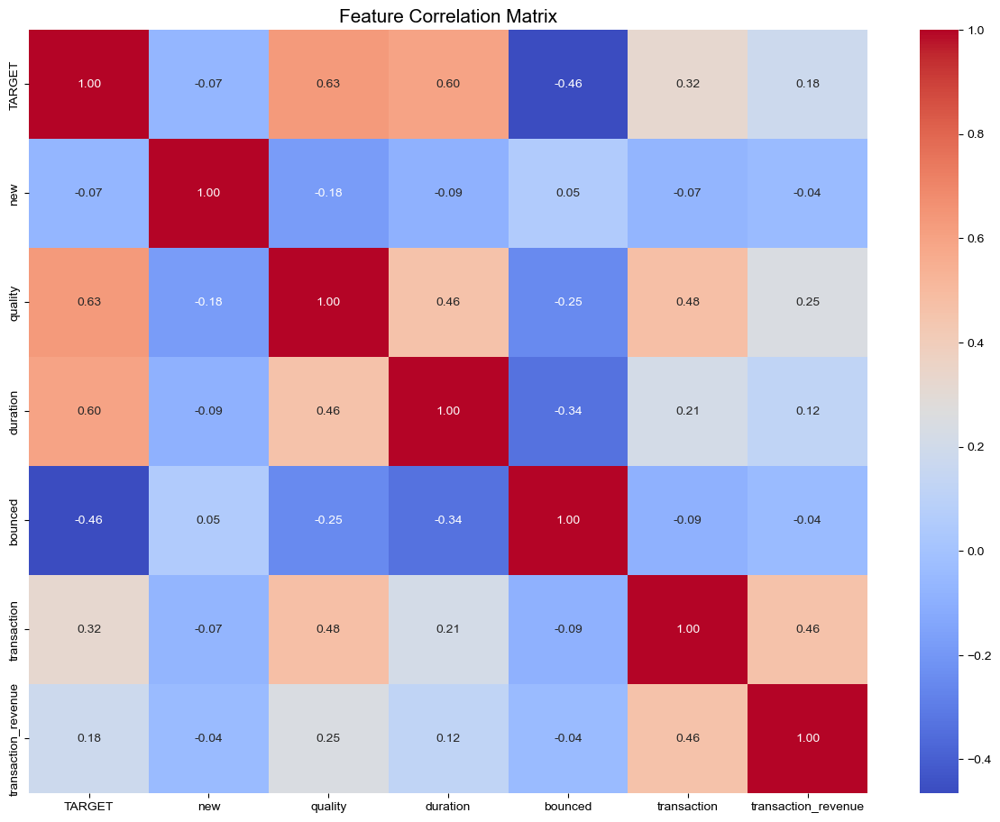

In [12]:
corr = train.corr()

plt.rcParams['font.family'] = 'Arial'
plt.figure(figsize=(15, 11))

sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm')

plt.title('Feature Correlation Matrix', fontsize=15)

plt.show()

### quality, duration이 TARGET과 높은 상관관계 보이는 것을 확인

## 1. Session ID, userID
- feature 처리 X
- drop 예정

In [13]:
result_df = train.groupby("userID").agg(
    sessionID_count=('sessionID', 'count'),
    TARGET_mean=('TARGET', 'mean')
).reset_index()

result_df

,userID,sessionID_count,TARGET_mean
0,USER_000000,1,17.000000
1,USER_000001,1,3.000000
2,USER_000002,1,1.000000
3,USER_000003,1,1.000000
4,USER_000004,3,3.666667
...,...,...,...
206019,USER_206019,1,3.000000
206020,USER_206020,1,1.000000
206021,USER_206021,1,1.000000
206022,USER_206022,1,1.000000


#### 동일한 유저가 세션에 여러번 접속하였다고 해서 TARGET에 영향을 주지 않는다고 판단해서 칼럼을 제거
- 그 뒤 quality, duration, bounced값들이 같은 유저여도 세션별로 다르기 때문에 TARGET에 영향을 미친다고 판단함

In [14]:
user_000004_rows = train[train['userID'] == 'USER_000004']
user_000004_rows

,sessionID,userID,TARGET,browser,OS,device,new,quality,duration,bounced,transaction,transaction_revenue,continent,subcontinent,country,traffic_source,traffic_medium,keyword,referral_path
4,SESSION_000004,USER_000004,1.0,Chrome,iOS,mobile,0,1.0,0.0,1,0.0,0.0,Americas,Northern America,United States,groups.google.com,referral,None,Category6_Path_0000
13390,SESSION_013390,USER_000004,9.0,Chrome,iOS,mobile,0,23.0,623.0,0,0.0,0.0,Americas,Northern America,United States,groups.google.com,referral,None,Category6_Path_0000
17151,SESSION_017151,USER_000004,1.0,Chrome,iOS,mobile,0,1.0,0.0,1,0.0,0.0,Americas,Northern America,United States,groups.google.com,referral,None,Category6_Path_0000


## 2. browser 
- Safari통합
- 1% 미만 칼럼 else로 처리
- one-hot-encoding

In [15]:
pd.set_option('display.max_rows', None)
browser_counts = train['browser'].value_counts()
browser_counts

Chrome                                                  174395
Safari                                                   35689
Android Webview                                          13855
Firefox                                                   8436
Internet Explorer                                         4573
Edge                                                      3702
Samsung Internet                                          3077
Opera Mini                                                3041
Safari (in-app)                                           1995
Opera                                                     1331
UC Browser                                                 901
YaBrowser                                                  402
Amazon Silk                                                257
Coc Coc                                                    206
Mozilla Compatible Agent                                   124
Android Browser                                        

#### Safari(in-app) 필요없는 것 확인 
- 어차피 device에서 나뉨

In [16]:
pd.set_option('display.max_rows', 20)
len(train[(train["browser"] == 'Safari (in-app)') & (train["device"] == 'desktop')]) 

# Safari (in-app)은 모두 desktop

0

In [17]:
train['browser'] = train['browser'].replace('Safari (in-app)', 'Safari')

#### browser칼럼의 비율 확인

In [18]:
browser_percentage = train['browser'].value_counts(normalize=True)
browser_percentage * 100

Chrome                                                  69.125091
Safari                                                  14.936838
Android Webview                                          5.491718
Firefox                                                  3.343784
Internet Explorer                                        1.812604
                                                          ...    
eosutpkiahjzvdgcwxlmyfqbrn                               0.000396
;__CT_JOB_ID__:76fd1acb-e365-43c0-b967-908bcf5d5b59;     0.000396
wvsmagudcqeytijorlhxnfzkbp                               0.000396
efkaxnbyohqtspzlvcwrjmigdu                               0.000396
NokiaC7-00                                               0.000396
Name: browser, Length: 69, dtype: float64

#### 비율 < 1% 제거

In [19]:
threshold = 0.01
to_replace = browser_percentage[browser_percentage < threshold].index
train.loc[train['browser'].isin(to_replace), 'browser'] = 'else'

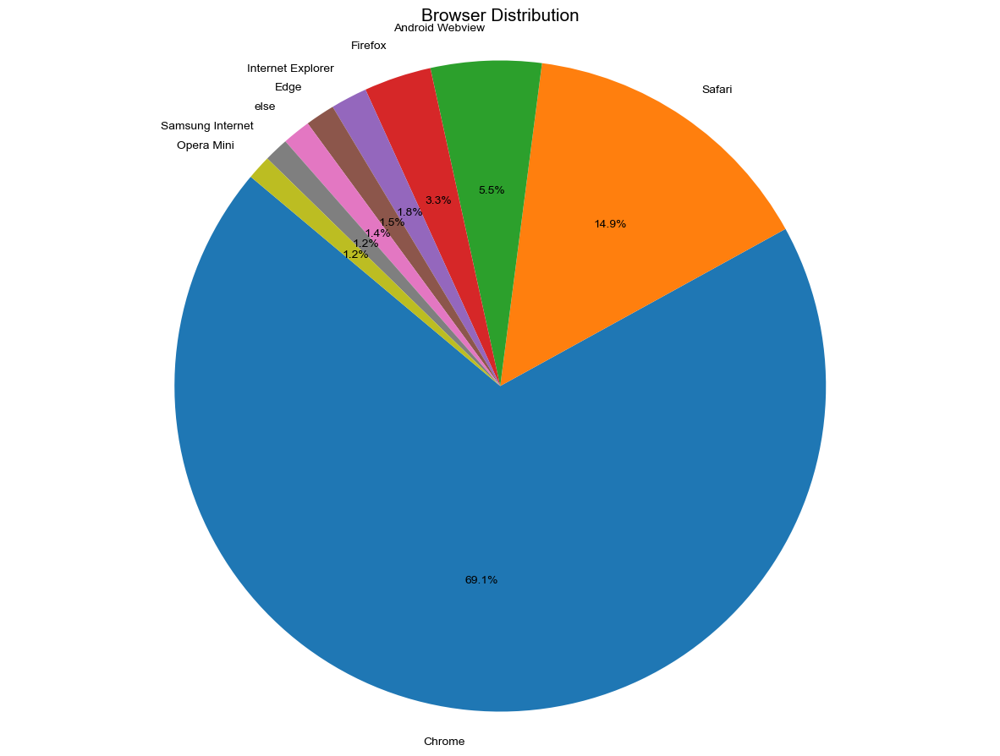

In [20]:
plt.figure(figsize=(15, 11))
plt.pie(train['browser'].value_counts(), labels=train['browser'].value_counts().index, autopct='%1.1f%%', startangle=140)
plt.title('Browser Distribution', fontsize=15)
plt.axis('equal')
plt.show()

In [21]:
train['browser'].unique()

array(['Chrome', 'Samsung Internet', 'Firefox', 'else', 'Safari', 'Edge',
       'Android Webview', 'Internet Explorer', 'Opera Mini'], dtype=object)

## 3. OS
- 1% 미만 칼럼 else로 처리
- one-hot-encoding 처리

In [22]:
pd.set_option('display.max_rows', None)
OS_counts = train['OS'].value_counts()
OS_percentages = train['OS'].value_counts(normalize=True)
OS_counts, OS_percentages * 100

(Windows             88119
 Macintosh           60316
 Android             51870
 iOS                 29778
 Linux                9562
 Chrome OS            9222
 (not set)            2592
 Tizen                 321
 Samsung               259
 Windows Phone         128
 OS/2                   36
 Xbox                   31
 BlackBerry             29
 Playstation Vita        9
 Nintendo 3DS            6
 Firefox OS              4
 FreeBSD                 3
 SunOS                   1
 Nintendo WiiU           1
 SymbianOS               1
 Nokia                   1
 Name: OS, dtype: int64,
 Windows             34.927801
 Macintosh           23.907503
 Android             20.559755
 iOS                 11.803131
 Linux                3.790098
 Chrome OS            3.655332
 (not set)            1.027393
 Tizen                0.127235
 Samsung              0.102660
 Windows Phone        0.050735
 OS/2                 0.014269
 Xbox                 0.012287
 BlackBerry           0.011495
 Play

In [23]:
pd.set_option('display.max_rows', 20)

#### 비율 > 1% 제거

In [24]:
threshold = 0.01
to_replace = OS_percentages[OS_percentages < threshold].index
train.loc[train['OS'].isin(to_replace), 'OS'] = 'else'

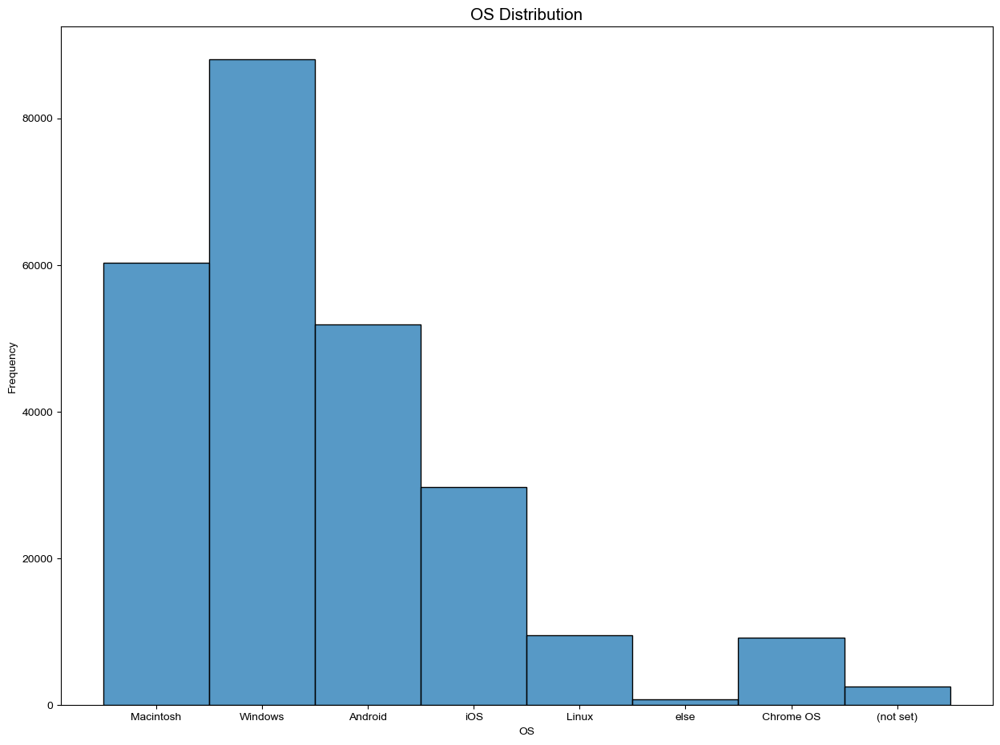

In [25]:
plt.figure(figsize=(15, 11))
sns.histplot(train['OS'], bins=30, kde=False)
plt.title('OS Distribution', fontsize=15)
plt.xlabel('OS')
plt.ylabel('Frequency')
plt.show()

## 4. device
- feature 처리 X
- one-hot-encoding 처리

In [26]:
device_counts = train['device'].value_counts()
device_counts

desktop    167133
mobile      76460
tablet       8696
Name: device, dtype: int64

## 5. new
- feature 처리 X

In [27]:
value_counts = train['new'].value_counts(normalize=True)
value_counts

1    0.751955
0    0.248045
Name: new, dtype: float64

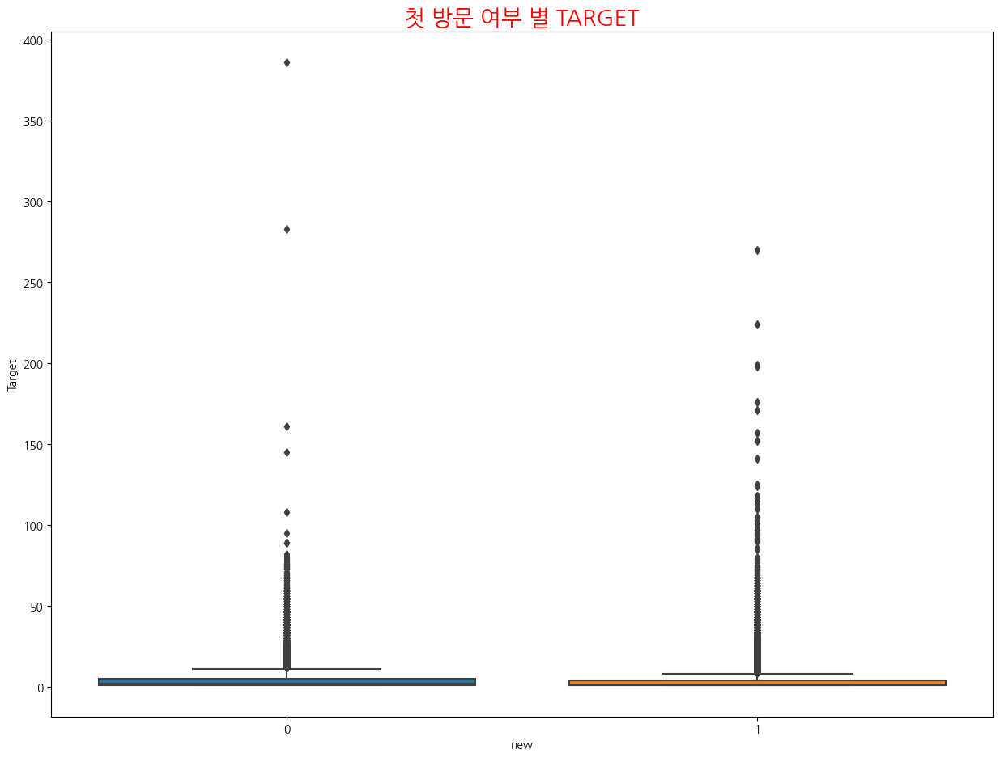

In [12]:
import matplotlib.font_manager as fm

plt.rcParams['font.family'] = 'Nanum Gothic'

plt.figure(figsize=(15, 11))
sns.boxplot(x='new', y='TARGET', data=train)
plt.title('첫 방문 여부 별 TARGET', fontsize=20, color='red')
plt.xlabel('new', fontsize=10)
plt.ylabel('Target', fontsize=10)

plt.show()

#### 첫 방문이 아닌 사람들이 자주 이용했을 가능성이 높으니 duration도 크지 않을까?

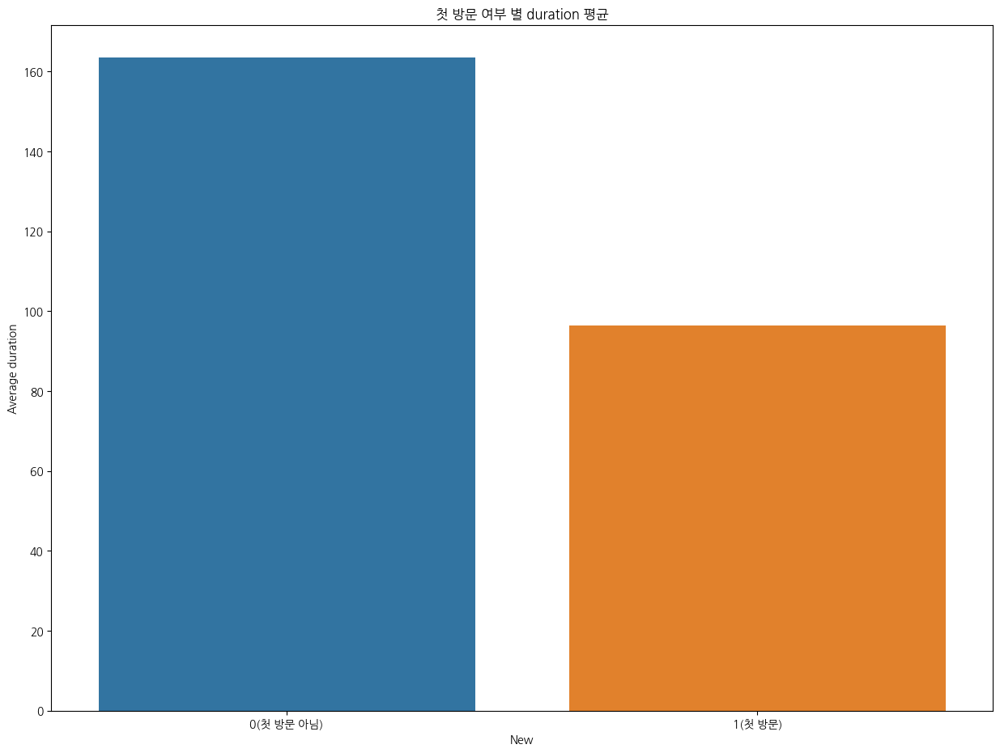

In [29]:
# 'new' 열의 값에 따른 'TARGET' 열의 평균 계산
target_means = train.groupby('new')['duration'].mean().reset_index()

# 시각화
plt.figure(figsize=(15, 11))
sns.barplot(x='new', y='duration', data=target_means)
plt.title('첫 방문 여부 별 duration 평균')
plt.xlabel('New')
plt.ylabel('Average duration')
plt.xticks([0, 1], ['0(첫 방문 아님)', '1(첫 방문)'])  # x축 눈금 레이블을 명시적으로 지정
plt.show()

따로 처리할건 없음

## 6. quality
- feature 처리 X

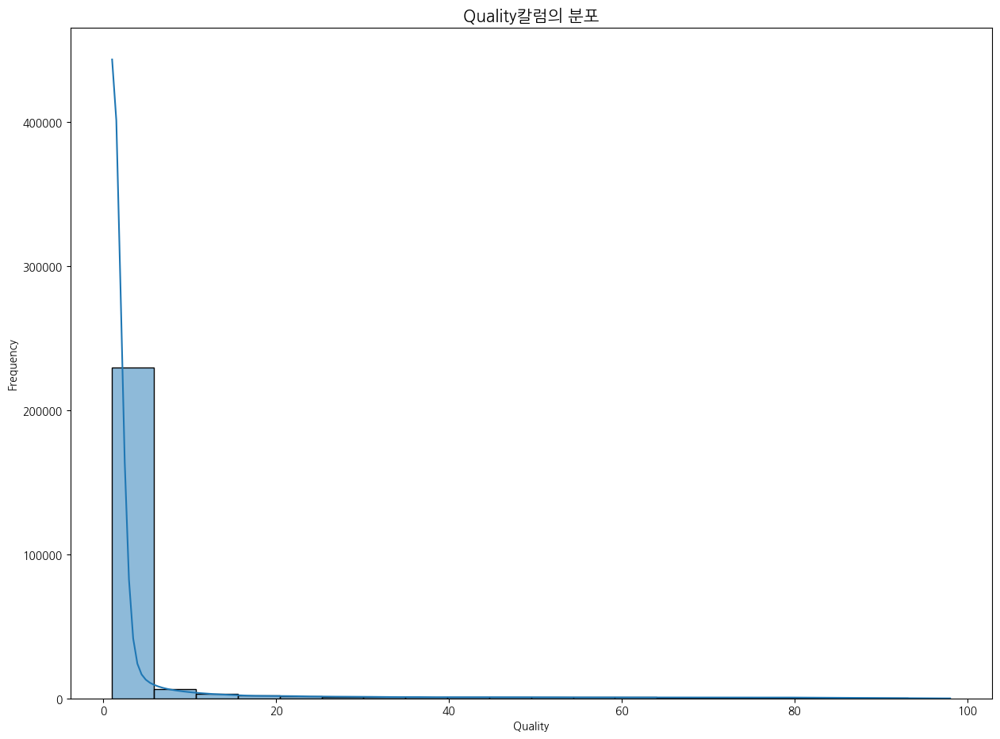

In [30]:
plt.figure(figsize=(15, 11))
sns.histplot(train['quality'], bins=20, kde=True)
plt.title('Quality칼럼의 분포', fontsize =15)
plt.xlabel('Quality')
plt.ylabel('Frequency')
plt.show()

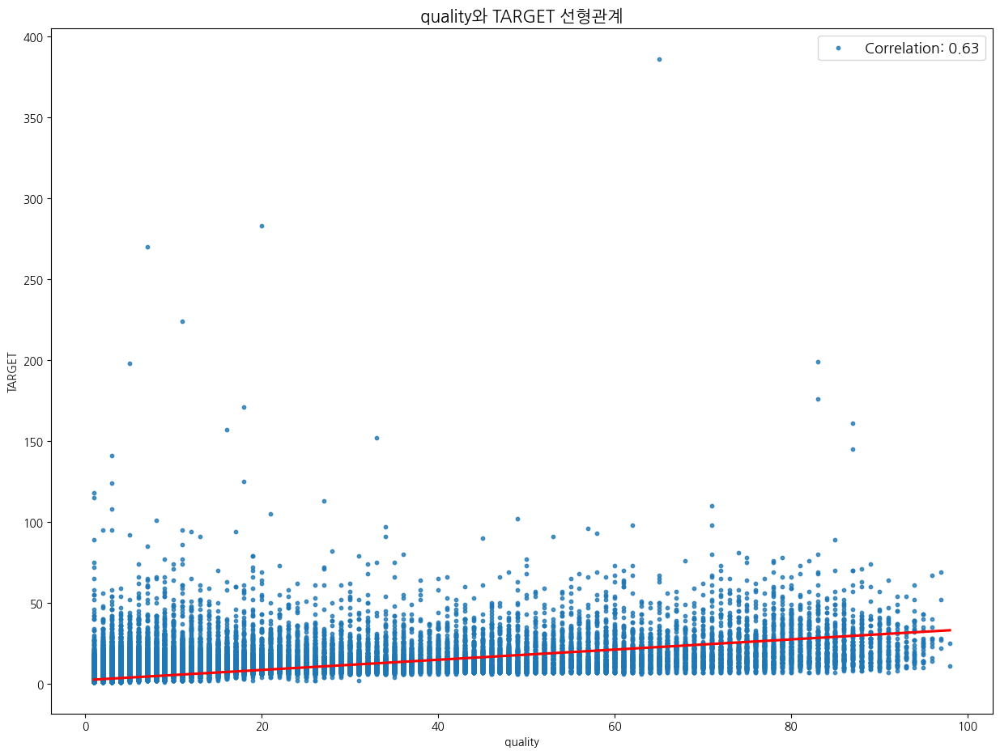

In [31]:
corr = train[['quality', 'TARGET']].corr().iloc[0, 1]  # quality와 TARGET 간의 상관계수

plt.figure(figsize=(15, 11))
sns.regplot(x='quality', y='TARGET', data=train, scatter_kws={'s': 10}, line_kws={"color": "red"})
plt.title('quality와 TARGET 선형관계', fontsize=15)
plt.xlabel('quality')
plt.ylabel('TARGET')

# 상관계수를 레전드에 추가
plt.legend(['Correlation: {:.2f}'.format(corr)], fontsize=13)
plt.show()

## 7. duration
- feature 처리 X

머무른 최대 시간 11186초 -> 186.43333분 (약 3시간)

In [32]:
train["duration"].max(), train["duration"].min()

(11186.0, 0.0)

In [33]:
max_duration_index = train["duration"].argmax()

target_value = train.loc[max_duration_index, 'TARGET']
print(f"{int(target_value)}회")

54회


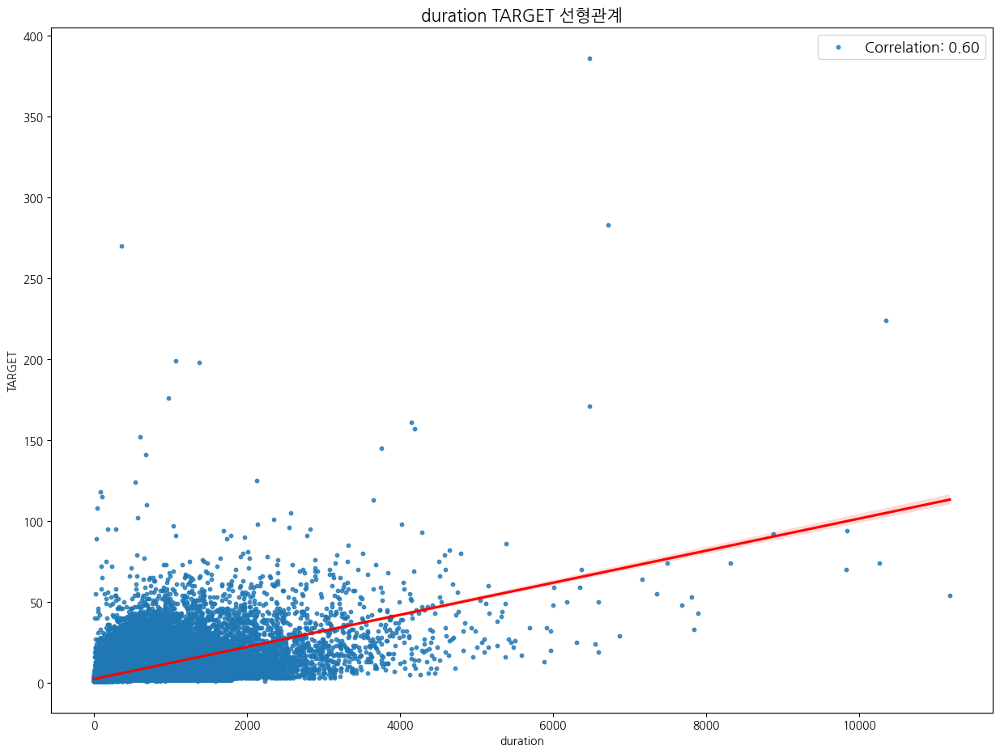

In [34]:
corr = train[['duration', 'TARGET']].corr().iloc[0, 1]

plt.figure(figsize=(15, 11))
sns.regplot(x='duration', y='TARGET', data=train, scatter_kws={'s': 10}, line_kws={"color": "red"})
plt.title('duration TARGET 선형관계', fontsize=15)
plt.xlabel('duration')
plt.ylabel('TARGET')

plt.legend(['Correlation: {:.2f}'.format(corr)], fontsize=13)
plt.show()

## 3차때 추가한 내용

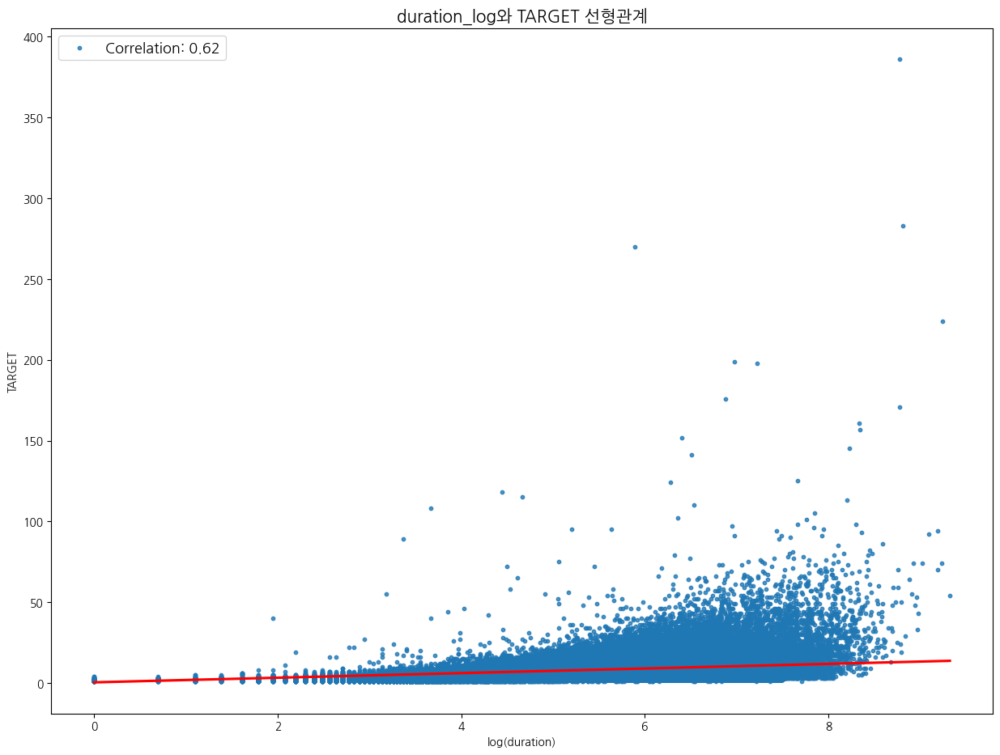

In [159]:
train['duration_log'] = np.log1p(train['duration'])

corr = train[['duration_log', 'TARGET']].corr().iloc[0, 1]

plt.figure(figsize=(15, 11))
sns.regplot(x='duration_log', y='TARGET', data=train, scatter_kws={'s': 10}, line_kws={"color": "red"})
plt.title('duration_log와 TARGET 선형관계', fontsize=15)
plt.xlabel('log(duration)')
plt.ylabel('TARGET')

plt.legend(['Correlation: {:.2f}'.format(corr)], fontsize=13)
plt.show()

## 8. bounced
- feature 처리 X

In [35]:
bounced_counts = train['bounced'].value_counts()
bounced_counts

0    127741
1    124548
Name: bounced, dtype: int64

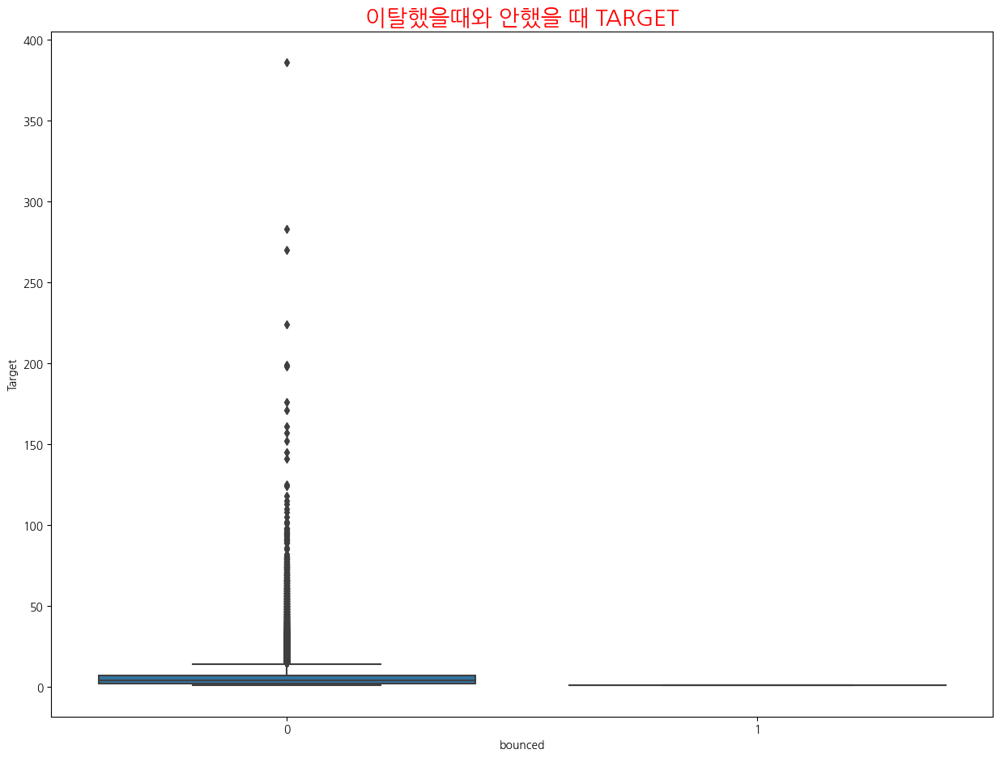

In [36]:
import matplotlib.font_manager as fm

plt.rcParams['font.family'] = 'Nanum Gothic'

plt.figure(figsize=(15, 11))
sns.boxplot(x='bounced', y='TARGET', data=train)
plt.title('이탈했을때와 안했을 때 TARGET', fontsize=20, color='red')
plt.xlabel('bounced', fontsize=10)
plt.ylabel('Target', fontsize=10)

plt.show()

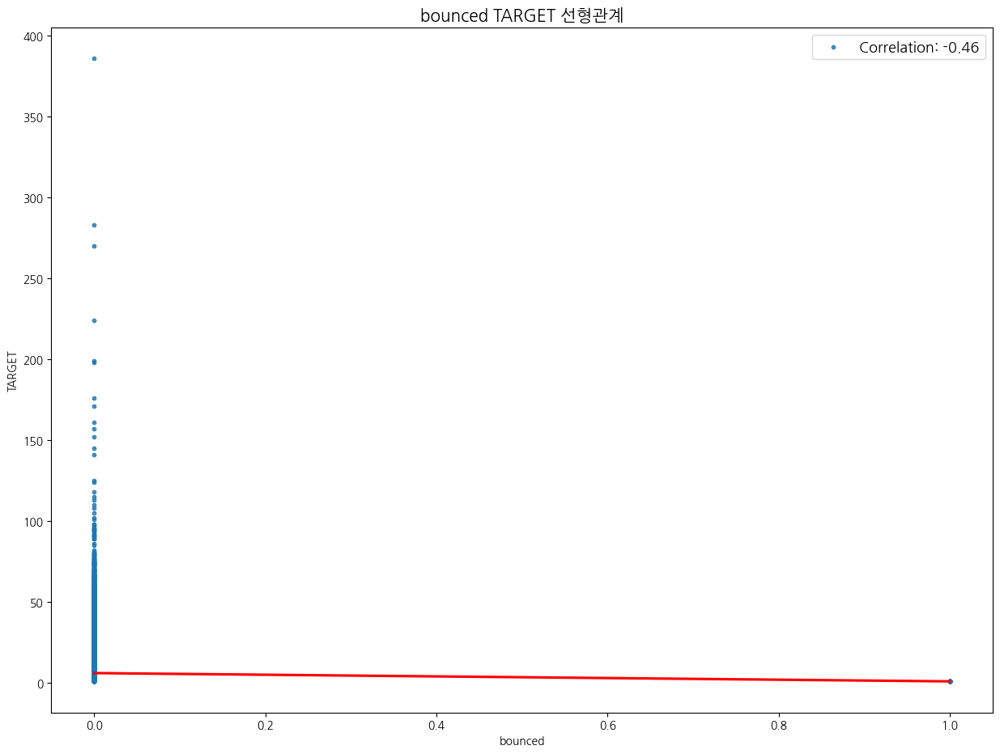

In [37]:
corr = train[['bounced', 'TARGET']].corr().iloc[0, 1]  # bounced와 TARGET 간의 상관계수

plt.figure(figsize=(15, 11))
sns.regplot(x='bounced', y='TARGET', data=train, scatter_kws={'s': 10}, line_kws={"color": "red"})
plt.title('bounced TARGET 선형관계', fontsize=15)
plt.xlabel('bounced')
plt.ylabel('TARGET')

# 상관계수를 레전드에 추가
plt.legend(['Correlation: {:.2f}'.format(corr)], fontsize=13)
plt.show()

## 9,10. transaction, transaction_revenue
- feature 처리 X

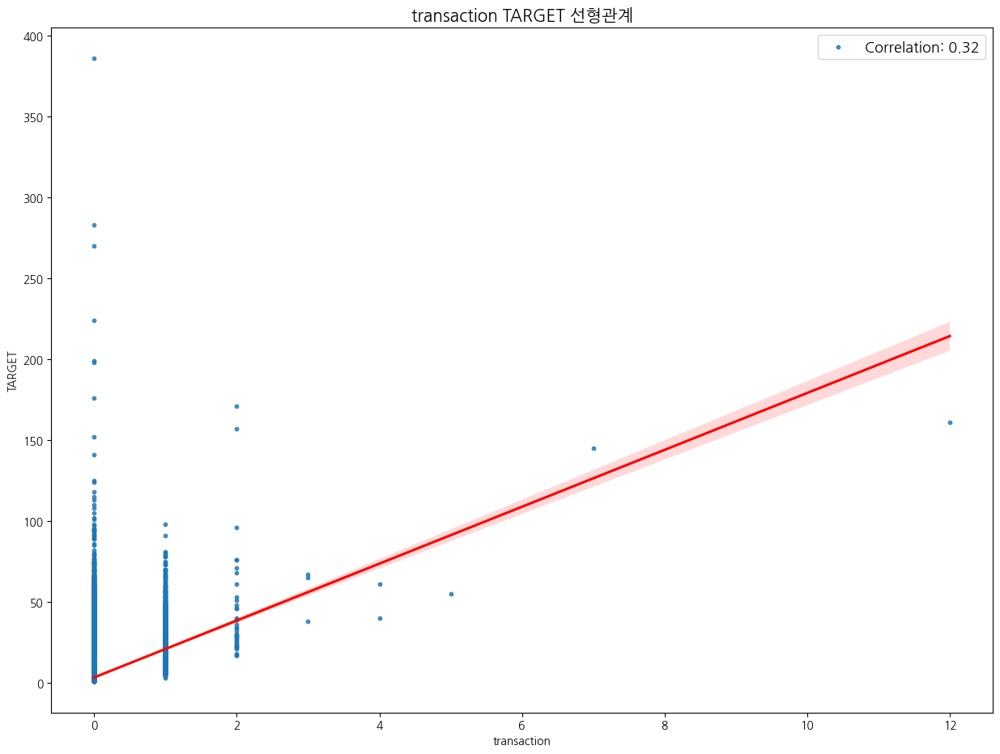

In [38]:
corr = train[['transaction', 'TARGET']].corr().iloc[0, 1]

plt.figure(figsize=(15, 11))
sns.regplot(x='transaction', y='TARGET', data=train, scatter_kws={'s': 10}, line_kws={"color": "red"})
plt.title('transaction TARGET 선형관계', fontsize=15)
plt.xlabel('transaction')
plt.ylabel('TARGET')

plt.legend(['Correlation: {:.2f}'.format(corr)], fontsize=13)
plt.show()

In [39]:
train["transaction"].max(), train["transaction_revenue"].max()

(12.0, 3325712000.0)

달러라고 가정하였을 때, </br>

3325712000 달러 ?? -> 약 4조 50억원

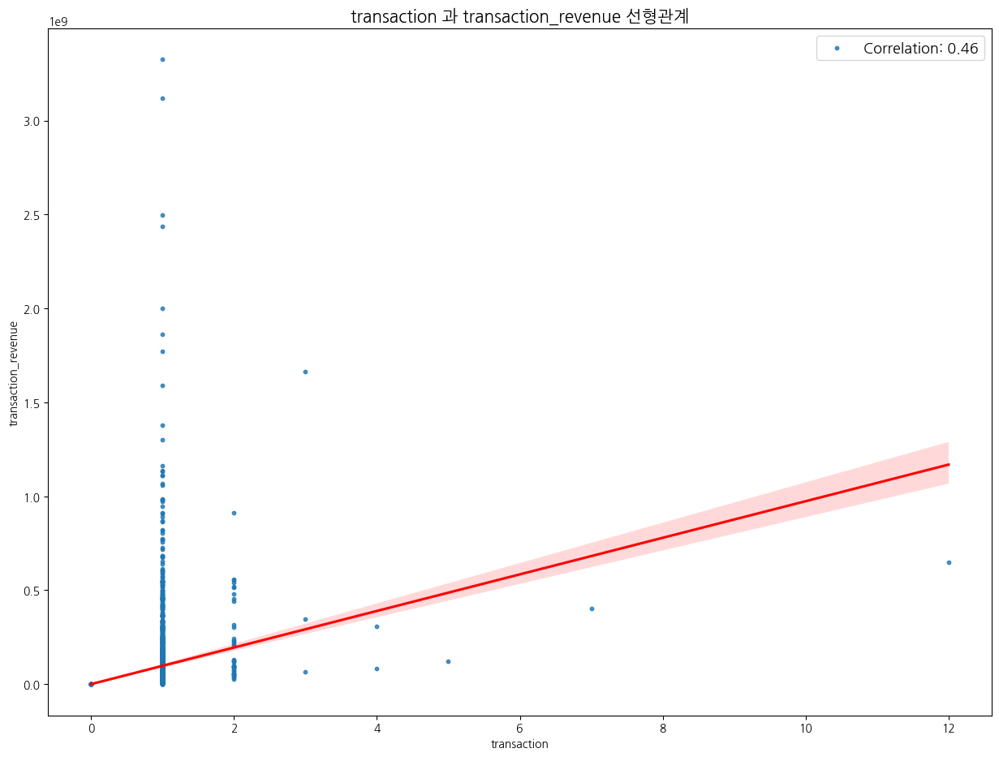

In [40]:
corr = train[['transaction', 'transaction_revenue']].corr().iloc[0, 1]

plt.figure(figsize=(15, 11))
sns.regplot(x='transaction', y='transaction_revenue', data=train, scatter_kws={'s': 10}, line_kws={"color": "red"})
plt.title('transaction 과 transaction_revenue 선형관계', fontsize=15)
plt.xlabel('transaction')
plt.ylabel('transaction_revenue')

plt.legend(['Correlation: {:.2f}'.format(corr)], fontsize=13)
plt.show()

## 11. continent
- feature처리 X
- one-hot-encoding 처리

In [41]:
pd.set_option('display.max_rows', None)
subcontinent_percentages = train['continent'].value_counts(normalize=True)
subcontinent_percentages * 100

Americas     50.143288
Asia         22.693815
Europe       21.304139
Africa        4.167443
Oceania       1.558134
(not set)     0.133181
Name: continent, dtype: float64

## 12. subcontinent
- feature처리 X
- drop 예정

In [51]:
subcontinent_percentages = train['subcontinent'].value_counts(normalize=True)
subcontinent_percentages * 100

Northern America      44.371732
Southern Asia          8.618687
Western Europe         7.263495
Northern Europe        6.116795
Southeast Asia         5.540075
Eastern Asia           5.389851
Southern Europe        4.261779
South America          3.880867
Eastern Europe         3.662070
Western Asia           3.042939
Northern Africa        2.193516
Central America        1.665154
Australasia            1.543864
Southern Africa        0.857746
Western Africa         0.781247
Eastern Africa         0.259623
Caribbean              0.225535
(not set)              0.133181
Central Asia           0.102264
Middle Africa          0.075310
Micronesian Region     0.007135
Melanesia              0.003964
Polynesia              0.003171
Name: subcontinent, dtype: float64

## 13. country
- feature처리 X
- drop 예정

In [52]:
country_percentages = train['country'].value_counts(normalize=True)
country_percentages * 100

United States               41.302237
India                        7.649957
United Kingdom               3.971239
Canada                       3.065928
Germany                      2.504667
France                       2.130097
Japan                        2.062714
Brazil                       2.000087
Spain                        1.713115
Egypt                        1.672685
Taiwan                       1.590240
Thailand                     1.441997
Mexico                       1.412666
Turkey                       1.403945
Netherlands                  1.323482
Australia                    1.316348
Vietnam                      1.290187
Russia                       1.210913
Italy                        1.185942
South Korea                  0.926319
Indonesia                    0.879547
South Africa                 0.846252
Poland                       0.741610
Singapore                    0.723773
Ireland                      0.671056
Sweden                       0.615960
Nigeria     

## 14. traffic_source
- 중복되는 웹사이트 통합 후
- 1% 미만 칼럼 else로 처리
- one-hot-encoding 처리

In [53]:
train["traffic_source"].unique()

array(['google', '(direct)', 'Partners', 'youtube', 'bing', 'baidu',
       'quora.com', 'pinterest', 'dealspotr.com', 'qiita.com', 'facebook',
       'reddit.com', 'blog.golang.org', 'yahoo', 'dfa', 't.co',
       'lunametrics.com', 's0.2mdn.net', 'm.baidu.com',
       'int.search.tb.ask.com', 'arstechnica.com', 'msn.com',
       'duckduckgo.com', 'r.search.aol.com', 'outlook.live.com', 'ask',
       'sashihara.jp', 'github.com', 'myasucourses.asu.edu',
       'gophergala.com', 'learn.pct.edu', 'phandroid.com',
       'online-metrics.com', 'evernote.com', 'web.telegram.org',
       'search.1and1.com', 'getpocket.com', 'bluequill.franklin.edu',
       'feedly.com', 'search.snapdo.com', 'online.fullsail.edu',
       'away.vk.com', 'l.messenger.com', 'so.com', 'kik.com',
       'kidrex.org', 'search.tb.ask.com', 'search.xfinity.com',
       'businessinsider.com', 'aulagrado.esic.edu', 'mail1.swic.edu',
       'startpage.com', 'learn.colorado.edu', 'web.whatsapp.com',
       'lisham-web.b

In [54]:
len(train["traffic_source"].unique())

72

#### '.' 을 기준으로 새로운 데이터프레임 생성

In [55]:
split_columns = train['traffic_source'].str.split('.', expand=True)
column_names = ['first word', 'second word', 'third word', 'fourth word', 'fifth word'][:split_columns.shape[1]]
split_columns.columns = column_names

In [29]:
split_columns

,first word,second word,third word,fourth word,fifth word
0,google,None,None,None,None
1,google,None,None,None,None
2,(direct),None,None,None,None
3,Partners,None,None,None,None
4,groups,google,com,None,None
...,...,...,...,...,...
252284,youtube,com,None,None,None
252285,google,None,None,None,None
252286,(direct),None,None,None,None
252287,youtube,com,None,None,None


In [140]:
# split_columns['first word'].value_counts().sort_values(ascending=False)
# split_columns['second word'].value_counts().sort_values(ascending=False)
# split_columns['third word'].value_counts().sort_values(ascmending=False)
# split_columns['fourth word'].value_counts().sort_values(ascending=False)
# split_columns['fifth word'].value_counts().sort_values(ascending=False)

많이 나온 단어들 중 웹사이트인 것들 5개 뽑아서 통합

In [30]:
change_traffic_source = ['google', 'facebook', 'yahoo', 'youtube', 'pinterest']


for i in change_traffic_source:
    train.loc[train['traffic_source'].str.contains(i, case=False, na=False), 'traffic_source'] = i

In [31]:
len(train["traffic_source"].unique())

72

In [32]:
Ts_percentages = train['traffic_source'].value_counts(normalize=True)
Ts_percentages * 100

google                  51.244010
(direct)                23.396185
youtube                 20.958504
Partners                 2.128115
facebook                 0.296089
                          ...    
so.com                   0.000396
search.earthlink.net     0.000396
kidrex.org               0.000396
de.wow.com               0.000396
feedly.com               0.000396
Name: traffic_source, Length: 72, dtype: float64

In [33]:
threshold = 0.01
to_replace = Ts_percentages[Ts_percentages < threshold].index
train.loc[train['traffic_source'].isin(to_replace), 'traffic_source'] = 'else'

In [34]:
Ts_percentages = train['traffic_source'].value_counts(normalize=True)
Ts_percentages * 100

google      51.244010
(direct)    23.396185
youtube     20.958504
else         2.273187
Partners     2.128115
Name: traffic_source, dtype: float64

## 15. traffic_medium
- feature 처리 X
- one-hot-encoding 처리

#### traffic_medium이 (none)인 value는 특별한 매체없이 'direct, 직접 들어옴' 이라는 뜻이고 확인결과 그러한 것으로 나타남

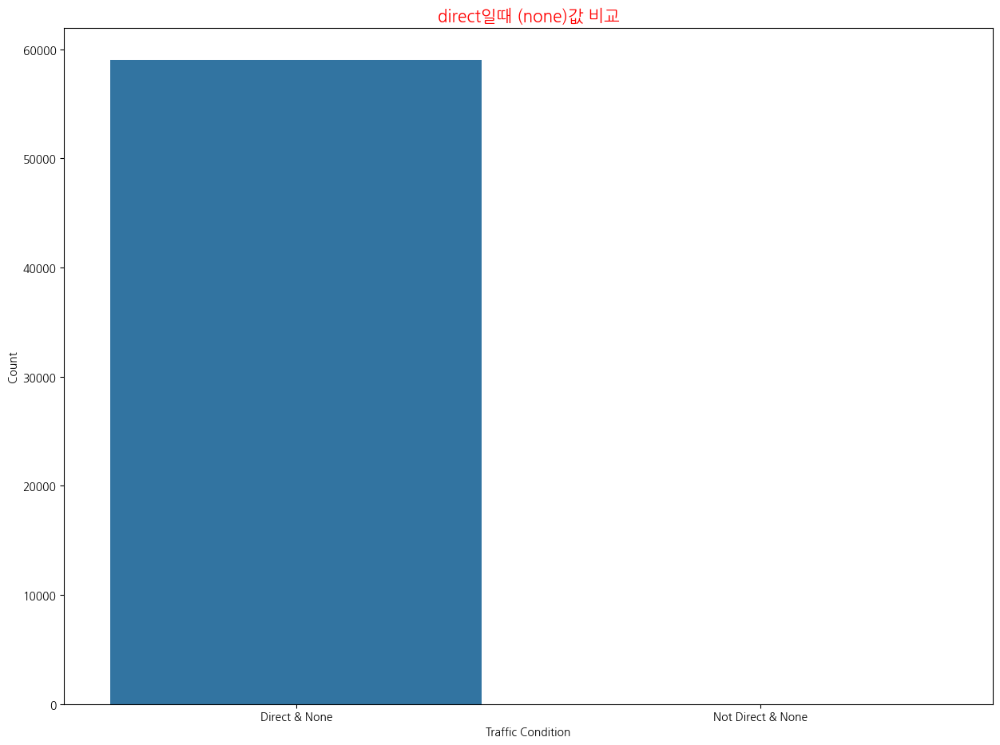

In [159]:
direct_none = len(train[(train["traffic_source"] == '(direct)') & (train["traffic_medium"] == '(none)')])
not_direct_none = len(train[(train["traffic_source"] != '(direct)') & (train["traffic_medium"] == '(none)')])

data_to_plot = {
    'Condition': ['Direct & None', 'Not Direct & None'],
    'Count': [direct_none, not_direct_none]
}

df_to_plot = pd.DataFrame(data_to_plot)

plt.figure(figsize=(15, 11))
sns.barplot(x='Condition', y='Count', data=df_to_plot)
plt.title('direct일때 (none)값 비교', fontsize=15, color='red')
plt.xlabel('Traffic Condition')
plt.ylabel('Count')
plt.show()

## keyword
- Category+정수로 데이터 통합
- one-hot-encoding 처리

In [35]:
train['keyword'].isnull().sum()

137675

#### keyword 칼럼의 값은 traffic_medium의 값이 organic, cpc일 경우에만 존재하는 값. 나머지는 null

In [36]:
# null값 분포

tm_unique = train['traffic_medium'].unique()

for i in tm_unique:
    print(f'{i} :', len(train[(train['keyword'].isnull()) & (train['traffic_medium'] == i)]))

organic : 2685
(none) : 59022
affiliate : 5365
referral : 70047
cpc : 49
cpm : 501
(not set) : 6


In [37]:
# not-null값 분포

for i in tm_unique:
    print(f'{i} :', len(train[(train['keyword'].notnull()) & (train['traffic_medium'] == i)]))

organic : 104685
(none) : 0
affiliate : 0
referral : 0
cpc : 9929
cpm : 0
(not set) : 0


In [38]:
keyword_values = train["keyword"].value_counts()
keyword_values

Category8                103584
Category9                  3488
Category11                 1931
Category10                 1147
Category6_Keyword_003       634
                          ...  
Category2_Keyword_273         1
Category1_Keyword_271         1
Category3_Keyword_270         1
Category4_Keyword_269         1
Category4_Keyword_617         1
Name: keyword, Length: 623, dtype: int64

In [39]:
train['category'] = train['keyword'].str.split('_').str[0]

for i in range(1, 101):
    category_name = f'Category{i}'
    train.loc[train['category'] == category_name, 'keyword'] = category_name

In [40]:
keyword_percentages = train['keyword'].value_counts(normalize=True) * 100
keyword_percentages

Category8     90.376394
Category9      3.043258
Category11     1.684785
Category1      1.149947
Category10     1.000750
Category6      0.978066
Category2      0.670948
Category4      0.350742
Category12     0.347253
Category3      0.260003
Category5      0.082014
Category7      0.055840
Name: keyword, dtype: float64

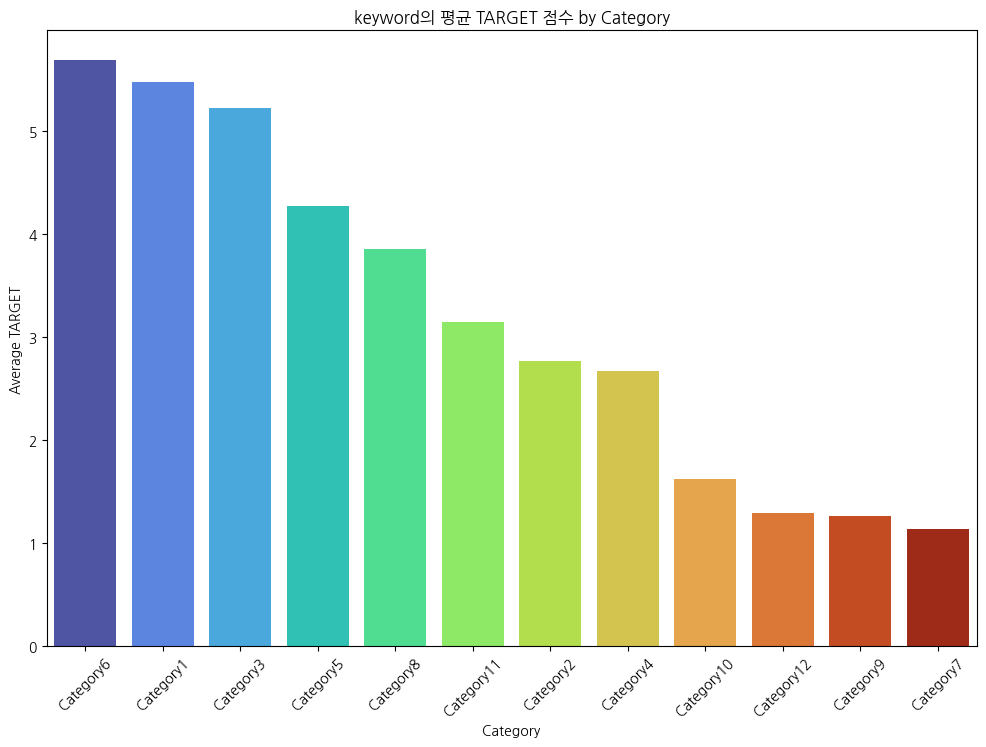

In [44]:
category_target_mean = train.groupby('category')['TARGET'].mean().reset_index()
category_target_mean_sorted = category_target_mean.sort_values('TARGET', ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(x='category', y='TARGET', data=category_target_mean_sorted, palette='turbo')
plt.title('keyword의 평균 TARGET 점수 by Category')
plt.xlabel('Category')
plt.ylabel('Average TARGET')
plt.xticks(rotation=45)
plt.show()

In [45]:
category_target_mean_sorted

,category,TARGET
8,Category6,5.694915
0,Category1,5.476480
5,Category3,5.224832
7,Category5,4.276596
10,Category8,3.857970
2,Category11,3.144485
4,Category2,2.771131
6,Category4,2.676617
1,Category10,1.625981
3,Category12,1.291457


In [46]:
train.drop(['category'],axis=1, inplace=True)

#### 결측치 채우기 -> 'not_applicable'

In [47]:
train['keyword'] = train['keyword'].fillna('not_applicable')

## referral_path
- referral_path값이 존재하지만 traffic_medium이 (none)인값들은 모두 referral로 변경

In [103]:
pd.set_option('display.max_rows', 20)

In [49]:
for i in tm_unique:
    print(f'{i} :', len(train[(train['referral_path'].notnull()) & (train['traffic_medium'] == i)]))

organic : 0
(none) : 21135
affiliate : 0
referral : 70047
cpc : 0
cpm : 0
(not set) : 0


In [50]:
train.loc[(train['traffic_medium'] == '(none)') & (train['referral_path'].notnull()), 'traffic_medium'] = 'referral'

In [51]:
for i in tm_unique:
    print(f'{i} :', len(train[(train['referral_path'].isnull()) & (train['traffic_medium'] == i)]))

organic : 107370
(none) : 37887
affiliate : 5365
referral : 0
cpc : 9978
cpm : 501
(not set) : 6


In [52]:
referral_path_percentages = train['referral_path'].value_counts(normalize=True)
referral_path_percentages * 100

Category1               20.494176
Category3_Path_0013      7.916036
Category2_Path_0018      4.372574
Category6_Path_0008      3.544559
Category7_Path_0001      3.272576
                          ...    
Category2_Path_1096      0.001097
Category11_Path_1089     0.001097
Category11_Path_1088     0.001097
Category4_Path_1086      0.001097
Category6_Path_1576      0.001097
Name: referral_path, Length: 1578, dtype: float64

In [53]:
train['category'] = train['referral_path'].str.split('_').str[0]

for i in range(1, 101):
    category_name = f'Category{i}'
    train.loc[train['category'] == category_name, 'referral_path'] = category_name

In [54]:
referral_path_percentages = train['referral_path'].value_counts(normalize=True)
referral_path_percentages * 100

Category1     20.494176
Category2     15.005155
Category11    13.341449
Category13    10.720318
Category3      8.500581
Category6      7.587024
Category5      5.777456
Category8      5.027308
Category4      4.130201
Category12     3.785835
Category7      3.315347
Category9      1.511263
Category10     0.803887
Name: referral_path, dtype: float64

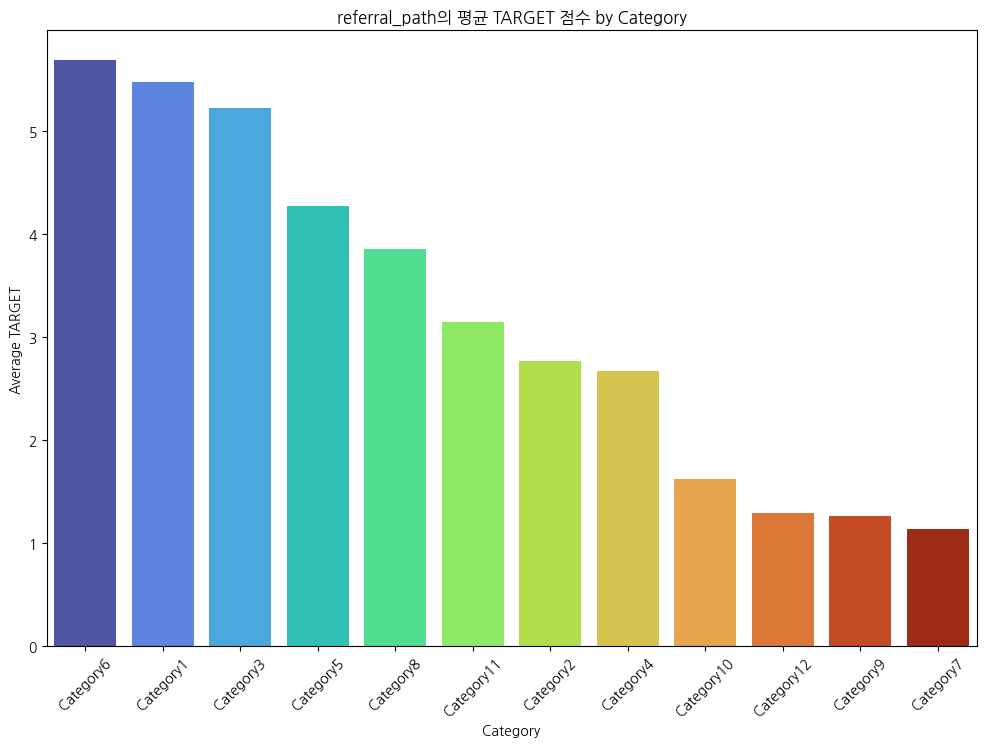

In [55]:
category_target_mean_sorted = category_target_mean.sort_values('TARGET', ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(x='category', y='TARGET', data=category_target_mean_sorted, palette='turbo')
plt.title('referral_path의 평균 TARGET 점수 by Category')
plt.xlabel('Category')
plt.ylabel('Average TARGET')
plt.xticks(rotation=45)
plt.show()

In [56]:
category_target_mean_sorted

,category,TARGET
8,Category6,5.694915
0,Category1,5.476480
5,Category3,5.224832
7,Category5,4.276596
10,Category8,3.857970
2,Category11,3.144485
4,Category2,2.771131
6,Category4,2.676617
1,Category10,1.625981
3,Category12,1.291457


In [57]:
train.drop(['category'], axis=1, inplace=True)

#### 결측치 처리완료

In [58]:
train['referral_path'] = train['referral_path'].fillna('not_applicable')

#### 추천경로로 traffic_source 알아보기

In [59]:
selected_columns = train[['referral_path', 'traffic_source']]
selected_columns

,referral_path,traffic_source
0,not_applicable,google
1,not_applicable,google
2,not_applicable,(direct)
3,not_applicable,Partners
4,Category6,google
...,...,...
252284,Category5,youtube
252285,not_applicable,google
252286,Category1,(direct)
252287,Category2,youtube


관련없음

# 1차 Feature engineering

In [25]:
train_1 = train.copy()

In [102]:
def feature_engineering(dataset):
    
    # browser
    dataset['browser'] = dataset['browser'].replace('Safari (in-app)', 'Safari')
    
    browser_percentage = dataset['browser'].value_counts(normalize=True)
    threshold = 0.01
    to_replace = browser_percentage[browser_percentage < threshold].index
    dataset.loc[dataset['browser'].isin(to_replace), 'browser'] = 'else'
    
    # OS
    OS_percentages = dataset['OS'].value_counts(normalize=True)
    threshold = 0.01
    to_replace = OS_percentages[OS_percentages < threshold].index
    dataset.loc[dataset['OS'].isin(to_replace), 'OS'] = 'else'
    
    # traffic_source
    split_columns = dataset['traffic_source'].str.split('.', expand=True)
    column_names = ['first word', 'second word', 'third word', 'fourth word', 'fifth word'][:split_columns.shape[1]]
    split_columns.columns = column_names
    
    change_traffic_source = ['google', 'facebook', 'yahoo', 'youtube', 'pinterest']
    
    for i in change_traffic_source:
        dataset.loc[dataset['traffic_source'].str.contains(i, case=False, na=False), 'traffic_source'] = i

    Ts_percentages = dataset['traffic_source'].value_counts(normalize=True)
    threshold = 0.01
    to_replace = Ts_percentages[Ts_percentages < threshold].index
    dataset.loc[dataset['traffic_source'].isin(to_replace), 'traffic_source'] = 'else'
    
    # traffic_medium $ referral_path
    dataset.loc[(dataset['traffic_medium'] == '(none)') & (dataset['referral_path'].notnull()), 'traffic_medium'] = 'referral'
    
    # keyword
    dataset['category'] = dataset['keyword'].str.split('_').str[0]
    for i in range(1, 101):  
        category_name = f'Category{i}' 
        dataset.loc[dataset['category'] == category_name, 'keyword'] = category_name
    dataset.drop(['category'],axis=1, inplace=True)
    
    # referral_path
    dataset['category'] = dataset['referral_path'].str.split('_').str[0]
    for i in range(1, 101):  # 1부터 100까지 반복
        category_name = f'Category{i}'  # 현재 카테고리 이름 생성
        dataset.loc[dataset['category'] == category_name, 'referral_path'] = category_name
    dataset.drop(['category'],axis=1, inplace=True)
    
    # 결측치 처리
    dataset['keyword'] = dataset['keyword'].fillna('not_applicable')
    dataset['referral_path'] = dataset['referral_path'].fillna('not_applicable')

In [103]:
def data_preparing(dataset):
    dataset = dataset.drop(['sessionID', 'userID', 'subcontinent', 'country'], axis=1)

    dataset = pd.get_dummies(dataset, 
                             columns=['browser', 'OS', 'device', 'continent', 'traffic_source', 'traffic_medium', 'keyword', 'referral_path'])
    return dataset

## 함수 실행

In [26]:
feature_engineering(train_1)

In [27]:
train_1 = data_preparing(train_1)

### test에 대해 실행

In [87]:
feature_engineering(test)

In [88]:
test = data_preparing(test)

# 2차 Feature Engineering

<2차 수정사항>
1. duration=0 이면서 bounced=0인 데이터 제거(에러)
2. referral_path : one-hot-encoding -> mean_encoding
3. keyword : one-hot-encoding -> mean_encoding
4. Continent, subcontinent, country를 location이라는 하나의 데이터셋으로 통합 후, 0.1%미만은 else로 묶고 원핫인코딩

In [112]:
train_2 = train.copy()

In [113]:
def feature_engineering2(dataset):
    
    # 새로 추가 (duration) -> 에러제거
    dataset[~((dataset['duration'] == 0) & (dataset['bounced'] == 0))]
    
    # 새로 추가 (location)
    dataset['location'] = dataset['continent'] + '_' + dataset['subcontinent'] + '_' + dataset['country']
    dataset.drop(['continent', 'subcontinent', 'country'], axis=1, inplace=True)
    threshold = 0.01
    location_percentages = dataset['location'].value_counts(normalize=True) 
    to_replace = location_percentages[location_percentages < threshold].index
    dataset.loc[dataset['location'].isin(to_replace), 'location'] = 'else'
    
    # browser
    dataset['browser'] = dataset['browser'].replace('Safari (in-app)', 'Safari')
    
    browser_percentage = dataset['browser'].value_counts(normalize=True)
    threshold = 0.01
    to_replace = browser_percentage[browser_percentage < threshold].index
    dataset.loc[dataset['browser'].isin(to_replace), 'browser'] = 'else'
    
    # OS
    OS_percentages = dataset['OS'].value_counts(normalize=True)
    threshold = 0.01
    to_replace = OS_percentages[OS_percentages < threshold].index
    dataset.loc[dataset['OS'].isin(to_replace), 'OS'] = 'else'
    
    # traffic_source
    split_columns = dataset['traffic_source'].str.split('.', expand=True)
    column_names = ['first word', 'second word', 'third word', 'fourth word', 'fifth word'][:split_columns.shape[1]]
    split_columns.columns = column_names
    
    change_traffic_source = ['google', 'facebook', 'yahoo', 'youtube', 'pinterest']
    
    for i in change_traffic_source:
        dataset.loc[dataset['traffic_source'].str.contains(i, case=False, na=False), 'traffic_source'] = i

    Ts_percentages = dataset['traffic_source'].value_counts(normalize=True)
    threshold = 0.01
    to_replace = Ts_percentages[Ts_percentages < threshold].index
    dataset.loc[dataset['traffic_source'].isin(to_replace), 'traffic_source'] = 'else'
    
    # traffic_medium $ referral_path
    dataset.loc[(dataset['traffic_medium'] == '(none)') & (dataset['referral_path'].notnull()), 'traffic_medium'] = 'referral'
    
    # keyword
    dataset['category'] = dataset['keyword'].str.split('_').str[0]
    for i in range(1, 101):  
        category_name = f'Category{i}' 
        dataset.loc[dataset['category'] == category_name, 'keyword'] = category_name
    dataset.drop(['category'],axis=1, inplace=True)
    
    # referral_path
    dataset['category'] = dataset['referral_path'].str.split('_').str[0]
    for i in range(1, 101):  # 1부터 100까지 반복
        category_name = f'Category{i}'  # 현재 카테고리 이름 생성
        dataset.loc[dataset['category'] == category_name, 'referral_path'] = category_name
    dataset.drop(['category'],axis=1, inplace=True)
    
    # 결측치 처리
    dataset['keyword'] = dataset['keyword'].fillna('not_applicable')
    dataset['referral_path'] = dataset['referral_path'].fillna('not_applicable')

In [114]:
feature_engineering2(train_2)

In [115]:
feature_engineering2(test)

In [116]:
train_2.drop(['sessionID', 'userID'], axis=1, inplace=True)
train_2 = pd.get_dummies(train_2, columns=['browser','OS', 'device', 'traffic_source', 'traffic_medium', 'location'])

test.drop(['sessionID', 'userID'], axis=1, inplace=True)
test = pd.get_dummies(test, columns=['browser','OS', 'device', 'traffic_source', 'traffic_medium', 'location'])
    
mean_encoded_keyword = train_2.groupby('keyword')['TARGET'].mean()
mean_encoded_referral_path = train_2.groupby('referral_path')['TARGET'].mean()

train_2['referral_path_mean_encoded'] = train_2['referral_path'].map(mean_encoded_referral_path)
test['referral_path_mean_encoded'] = test['referral_path'].map(mean_encoded_referral_path)

train_2['keyword_mean_encoded'] = train_2['keyword'].map(mean_encoded_keyword)
test['keyword_mean_encoded'] = test['keyword'].map(mean_encoded_keyword)
    
train_2.drop(['referral_path'], axis=1, inplace=True)
test.drop(['referral_path'], axis=1, inplace=True)

train_2.drop(['keyword'], axis=1, inplace=True)
test.drop(['keyword'], axis=1, inplace=True)

# 3차 Feature Engineering

<3차 수정사항>
1. Continent, subcontinent, country를 location이라는 하나의 데이터셋으로 통합 후, 0.1%미만은 else로 묶고 원핫인코딩
2. duration -> log_duration변환
3. PCA 사용

In [102]:
train_3 = train.copy()

In [103]:
def feature_engineering3(dataset):
    
    # 새로 추가 (duration) -> 에러제거
    dataset[~((dataset['duration'] == 0) & (dataset['bounced'] == 0))]
    
    # 새로 추가 (location)
    dataset['location'] = dataset['continent'] + '_' + dataset['subcontinent'] + '_' + dataset['country']
    dataset.drop(['continent', 'subcontinent', 'country'], axis=1, inplace=True)
    threshold = 0.01
    location_percentages = dataset['location'].value_counts(normalize=True) 
    to_replace = location_percentages[location_percentages < threshold].index
    dataset.loc[dataset['location'].isin(to_replace), 'location'] = 'else'
    
    # 새로 추가 (log_transformations)
    dataset['duration_log'] = np.log1p(dataset['duration'])
    dataset.drop(['duration'], axis=1, inplace=True)
    
    # browser
    dataset['browser'] = dataset['browser'].replace('Safari (in-app)', 'Safari')
    
    browser_percentage = dataset['browser'].value_counts(normalize=True)
    threshold = 0.01
    to_replace = browser_percentage[browser_percentage < threshold].index
    dataset.loc[dataset['browser'].isin(to_replace), 'browser'] = 'else'
    
    # OS
    OS_percentages = dataset['OS'].value_counts(normalize=True)
    threshold = 0.01
    to_replace = OS_percentages[OS_percentages < threshold].index
    dataset.loc[dataset['OS'].isin(to_replace), 'OS'] = 'else'
    
    # traffic_source
    split_columns = dataset['traffic_source'].str.split('.', expand=True)
    column_names = ['first word', 'second word', 'third word', 'fourth word', 'fifth word'][:split_columns.shape[1]]
    split_columns.columns = column_names
    
    change_traffic_source = ['google', 'facebook', 'yahoo', 'youtube', 'pinterest']
    
    for i in change_traffic_source:
        dataset.loc[dataset['traffic_source'].str.contains(i, case=False, na=False), 'traffic_source'] = i

    Ts_percentages = dataset['traffic_source'].value_counts(normalize=True)
    threshold = 0.01
    to_replace = Ts_percentages[Ts_percentages < threshold].index
    dataset.loc[dataset['traffic_source'].isin(to_replace), 'traffic_source'] = 'else'
    
    # traffic_medium $ referral_path
    dataset.loc[(dataset['traffic_medium'] == '(none)') & (dataset['referral_path'].notnull()), 'traffic_medium'] = 'referral'
    
    # keyword
    dataset['category'] = dataset['keyword'].str.split('_').str[0]
    for i in range(1, 101):  
        category_name = f'Category{i}' 
        dataset.loc[dataset['category'] == category_name, 'keyword'] = category_name
    dataset.drop(['category'],axis=1, inplace=True)
    
    # referral_path
    dataset['category'] = dataset['referral_path'].str.split('_').str[0]
    for i in range(1, 101):  # 1부터 100까지 반복
        category_name = f'Category{i}'  # 현재 카테고리 이름 생성
        dataset.loc[dataset['category'] == category_name, 'referral_path'] = category_name
    dataset.drop(['category'],axis=1, inplace=True)
    
    # 결측치 처리
    dataset['keyword'] = dataset['keyword'].fillna('not_applicable')
    dataset['referral_path'] = dataset['referral_path'].fillna('not_applicable')

In [104]:
feature_engineering3(train_3)

In [105]:
feature_engineering3(test)

In [106]:
train_3.drop(['sessionID', 'userID'], axis=1, inplace=True)
train_3 = pd.get_dummies(train_3, columns=['browser','OS', 'device', 'traffic_source', 'traffic_medium', 'location'])

test.drop(['sessionID', 'userID'], axis=1, inplace=True)
test = pd.get_dummies(test, columns=['browser','OS', 'device', 'traffic_source', 'traffic_medium', 'location'])
    
mean_encoded_keyword = train_3.groupby('keyword')['TARGET'].mean()
mean_encoded_referral_path = train_3.groupby('referral_path')['TARGET'].mean()

train_3['referral_path_mean_encoded'] = train_3['referral_path'].map(mean_encoded_referral_path)
test['referral_path_mean_encoded'] = test['referral_path'].map(mean_encoded_referral_path)

train_3['keyword_mean_encoded'] = train_3['keyword'].map(mean_encoded_keyword)
test['keyword_mean_encoded'] = test['keyword'].map(mean_encoded_keyword)
    
train_3.drop(['referral_path'], axis=1, inplace=True)
test.drop(['referral_path'], axis=1, inplace=True)

train_3.drop(['keyword'], axis=1, inplace=True)
test.drop(['keyword'], axis=1, inplace=True)

# X,y data split

In [117]:
x_train = train_2.drop('TARGET', axis=1)
y_train = train_2['TARGET']

In [107]:
x_train = train_3.drop('TARGET', axis=1)
y_train = train_3['TARGET']

# Data Scaling

In [118]:
from sklearn import preprocessing

standard_scaler = preprocessing.StandardScaler()
x_train_scaled = standard_scaler.fit_transform(x_train)

In [119]:
standard_scaler = preprocessing.StandardScaler()
x_test_scaled = standard_scaler.fit_transform(test)

# PCA (3차 때 추가
- 데이터의 차원을 축소, 데이터의 특성을 가장 잘 나타내는 새로운 축(주성분)을 찾고, 이 축들을 기반으로 데이터를 재표현
- 누적 설명 분산 비율 : 주성분들이 데이터의 분산을 설명하는 비율을 순서대로 더한 값, 1에 가까울수록 주성분들로 데이터의 대부분을 설명할 수 있다는 의미

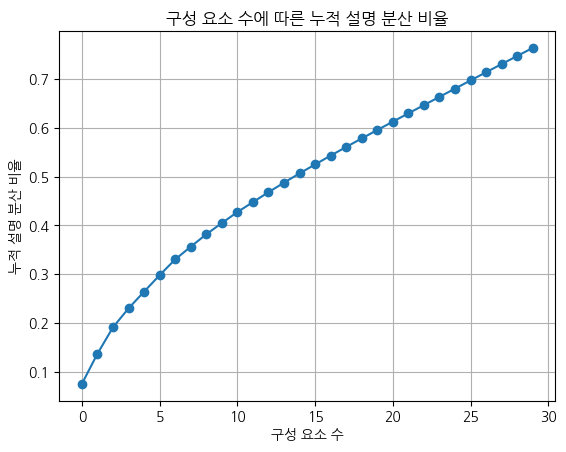

In [110]:
from sklearn.decomposition import PCA

pca = PCA(n_components=30)
pca.fit(x_train_scaled)

explained_variance_ratio_cumsum = np.cumsum(pca.explained_variance_ratio_)

plt.plot(explained_variance_ratio_cumsum, marker='o')
plt.xlabel('구성 요소 수')
plt.ylabel('누적 설명 분산 비율')
plt.title('구성 요소 수에 따른 누적 설명 분산 비율')
plt.grid(True)
plt.show()

In [19]:
x_train_scaled = pca.transform(x_train_scaled)
x_test_scaled = pca.transform(x_test_scaled)

# Train-test split

In [120]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(x_train_scaled, y_train, test_size=0.2, random_state=41)

In [121]:
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((201831, 60), (50458, 60), (201831,), (50458,))

# Linear Regression with NE

In [22]:
from sklearn.linear_model import LinearRegression

lr_ne = LinearRegression(fit_intercept=True)
lr_ne.fit(X_train, y_train)
y_hat = lr_ne.predict(X_val)
y_true = y_val
rmse = np.sqrt((((y_hat - y_true)**2).sum() / len(y_true)))
rmse

4.0594384562553305

In [23]:
import plotly.express as px
import plotly.graph_objects as go

fig = px.scatter(x=y_true, y=y_hat, labels={'x': 'Actual', 'y': 'Predicted'}, title='Actual vs. Predicted')

fig.add_trace(go.Scatter(x=y_true, y=y_true, mode='lines', name='Ideal Fit', line=dict(color='red')))

fig.show()

# Linear Regression with Ridge

In [24]:
from sklearn.linear_model import Lasso, Ridge

def make_Ridge():
    ridge = Ridge(fit_intercept=True, alpha=0.5)
    ridge.fit(X_train,y_train)
    y_hat = ridge.predict(X_val)
    y_true = y_val
    rmse = np.sqrt((((y_hat - y_true)**2).sum() / len(y_true)))
    return rmse

In [25]:
make_Ridge()

4.059438447774085

# RandomForest
- 의사결정나무에 배깅이라는 앙상블 학습을 적용한 모델
- 배깅 : 부트스트랩 샘플링을 이용하여 주어진 하나의 데이터로 학습된 예측 모형보다 더 좋은 모형을 만들 수 있는 앙상블 기법
- 과적합을 해소하고 분산을 감소시켜 정확도를 높임
- But, 계산 비용이 높고 규칙이 많아 추론 로직을 설명하기 어려움

</br>
참고 : </br>
-> https://zephyrus1111.tistory.com/245

In [36]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

model_rf = RandomForestRegressor(n_estimators=1000,  # 트리의 수
                                 max_depth = None,
                                 random_state=42, # 결과 재현을 위한 랜덤 시드
                                 n_jobs=-1)

model_rf.fit(X_train, y_train)

y_pred = model_rf.predict(X_val)

rmse = np.sqrt(mean_squared_error(y_val, y_pred))
print(f"RMSE Score: {rmse}")

RMSE Score: 3.3259027991781744


# 부스팅(Boosting)
- 여러 개의 약한 의사결정나무(Decision Tree)를 조합해서 사용하는 앙상블 기법 중 하나
- 약한 예측 모형들의 학습 에러에 가중치를 두고, 순차적으로 다음 학습모델에 반영하여 강한 예측모형을 만듬
- 일반적으로 부스팅은 강력한 기반 모델을 만드는 것이 아니라 반복적으로 오류를 고치는 데 초점
- 종류
    - AdaBoost
    - GBM
    - XGBoost
    - LightBoost
    
</br>
참고 : </br>
-> https://m.hanbit.co.kr/media/channel/view.html?cms_code=CMS7895414616 </br>
-> https://velog.io/@good159897/%EB%B6%80%EC%8A%A4%ED%8C%85-%EC%95%8C%EA%B3%A0%EB%A6%AC%EC%A6%98-Boosting-Algorithm

# XGboost (Extreme Gradient Boosting)
- GBM은 과적합, 속도의 문제 있음
- GBM의 단점을 보완하기 위해 고안
</br>

- GBM보다 빠른 속도
- 과적합 방지를 위한 규제
- 분류와 회귀 둘다 가능
- 가중치 업데이트는 경사하강법 기반

In [31]:
from xgboost import XGBRegressor

model = XGBRegressor(n_estimators=1500, 
                     learning_rate=0.1, 
                     max_depth=3, 
                     random_state=42,
                     n_jobs=1, 
                     early_stopping_rounds=10)

In [32]:
eval_set = [(X_train, y_train), (X_val, y_val)]  # 여기에 학습 데이터와 검증 데이터 세트 모두 추가

model.fit(X_train, y_train, eval_set=eval_set, verbose=True)
results = model.evals_result()

[0]	validation_0-rmse:5.31595	validation_1-rmse:5.35311
[1]	validation_0-rmse:5.15537	validation_1-rmse:5.19524
[2]	validation_0-rmse:5.01951	validation_1-rmse:5.06310
[3]	validation_0-rmse:4.89979	validation_1-rmse:4.94715
[4]	validation_0-rmse:4.78816	validation_1-rmse:4.83915
[5]	validation_0-rmse:4.67521	validation_1-rmse:4.72565
[6]	validation_0-rmse:4.58740	validation_1-rmse:4.64039
[7]	validation_0-rmse:4.50358	validation_1-rmse:4.55774
[8]	validation_0-rmse:4.42898	validation_1-rmse:4.48536
[9]	validation_0-rmse:4.36238	validation_1-rmse:4.41781
[10]	validation_0-rmse:4.29829	validation_1-rmse:4.35565
[11]	validation_0-rmse:4.24027	validation_1-rmse:4.29576
[12]	validation_0-rmse:4.19213	validation_1-rmse:4.24882
[13]	validation_0-rmse:4.14856	validation_1-rmse:4.20384
[14]	validation_0-rmse:4.10924	validation_1-rmse:4.16675
[15]	validation_0-rmse:4.07002	validation_1-rmse:4.12823
[16]	validation_0-rmse:4.03723	validation_1-rmse:4.09727
[17]	validation_0-rmse:4.00262	validation

[144]	validation_0-rmse:3.37705	validation_1-rmse:3.53269
[145]	validation_0-rmse:3.37527	validation_1-rmse:3.53223
[146]	validation_0-rmse:3.37440	validation_1-rmse:3.53184
[147]	validation_0-rmse:3.37253	validation_1-rmse:3.53007
[148]	validation_0-rmse:3.36675	validation_1-rmse:3.52893
[149]	validation_0-rmse:3.36365	validation_1-rmse:3.52732
[150]	validation_0-rmse:3.35922	validation_1-rmse:3.52662
[151]	validation_0-rmse:3.35836	validation_1-rmse:3.52617
[152]	validation_0-rmse:3.35672	validation_1-rmse:3.52466
[153]	validation_0-rmse:3.35566	validation_1-rmse:3.52385
[154]	validation_0-rmse:3.35458	validation_1-rmse:3.52305
[155]	validation_0-rmse:3.35210	validation_1-rmse:3.52526
[156]	validation_0-rmse:3.35087	validation_1-rmse:3.52414
[157]	validation_0-rmse:3.34904	validation_1-rmse:3.52300
[158]	validation_0-rmse:3.34200	validation_1-rmse:3.52030
[159]	validation_0-rmse:3.33714	validation_1-rmse:3.51993
[160]	validation_0-rmse:3.33589	validation_1-rmse:3.51908
[161]	validati

[286]	validation_0-rmse:3.15273	validation_1-rmse:3.41765
[287]	validation_0-rmse:3.15194	validation_1-rmse:3.41709
[288]	validation_0-rmse:3.15066	validation_1-rmse:3.41709
[289]	validation_0-rmse:3.14969	validation_1-rmse:3.41636
[290]	validation_0-rmse:3.14850	validation_1-rmse:3.41534
[291]	validation_0-rmse:3.14748	validation_1-rmse:3.41491
[292]	validation_0-rmse:3.14724	validation_1-rmse:3.41470
[293]	validation_0-rmse:3.14493	validation_1-rmse:3.41454
[294]	validation_0-rmse:3.14413	validation_1-rmse:3.41426
[295]	validation_0-rmse:3.14249	validation_1-rmse:3.41355
[296]	validation_0-rmse:3.14148	validation_1-rmse:3.41252
[297]	validation_0-rmse:3.14073	validation_1-rmse:3.41203
[298]	validation_0-rmse:3.13970	validation_1-rmse:3.41118
[299]	validation_0-rmse:3.13922	validation_1-rmse:3.41086
[300]	validation_0-rmse:3.13827	validation_1-rmse:3.41026
[301]	validation_0-rmse:3.13669	validation_1-rmse:3.40960
[302]	validation_0-rmse:3.13626	validation_1-rmse:3.40920
[303]	validati

[428]	validation_0-rmse:3.04702	validation_1-rmse:3.35754
[429]	validation_0-rmse:3.04557	validation_1-rmse:3.35765
[430]	validation_0-rmse:3.04504	validation_1-rmse:3.35718
[431]	validation_0-rmse:3.04293	validation_1-rmse:3.35686
[432]	validation_0-rmse:3.04228	validation_1-rmse:3.35648
[433]	validation_0-rmse:3.04200	validation_1-rmse:3.35607
[434]	validation_0-rmse:3.04092	validation_1-rmse:3.35579
[435]	validation_0-rmse:3.04028	validation_1-rmse:3.35561
[436]	validation_0-rmse:3.03988	validation_1-rmse:3.35528
[437]	validation_0-rmse:3.03950	validation_1-rmse:3.35531
[438]	validation_0-rmse:3.03925	validation_1-rmse:3.35494
[439]	validation_0-rmse:3.03851	validation_1-rmse:3.35462
[440]	validation_0-rmse:3.03798	validation_1-rmse:3.35449
[441]	validation_0-rmse:3.03705	validation_1-rmse:3.35380
[442]	validation_0-rmse:3.03651	validation_1-rmse:3.35315
[443]	validation_0-rmse:3.03591	validation_1-rmse:3.35287
[444]	validation_0-rmse:3.03548	validation_1-rmse:3.35305
[445]	validati

[570]	validation_0-rmse:2.96538	validation_1-rmse:3.31048
[571]	validation_0-rmse:2.96498	validation_1-rmse:3.31005
[572]	validation_0-rmse:2.96462	validation_1-rmse:3.30976
[573]	validation_0-rmse:2.96437	validation_1-rmse:3.30961
[574]	validation_0-rmse:2.96404	validation_1-rmse:3.30937
[575]	validation_0-rmse:2.96363	validation_1-rmse:3.30890
[576]	validation_0-rmse:2.96328	validation_1-rmse:3.30885
[577]	validation_0-rmse:2.96251	validation_1-rmse:3.30873
[578]	validation_0-rmse:2.96200	validation_1-rmse:3.30845
[579]	validation_0-rmse:2.96138	validation_1-rmse:3.30783
[580]	validation_0-rmse:2.96076	validation_1-rmse:3.30743
[581]	validation_0-rmse:2.95984	validation_1-rmse:3.30737
[582]	validation_0-rmse:2.95942	validation_1-rmse:3.30725
[583]	validation_0-rmse:2.95884	validation_1-rmse:3.30706
[584]	validation_0-rmse:2.95826	validation_1-rmse:3.30703
[585]	validation_0-rmse:2.95752	validation_1-rmse:3.30666
[586]	validation_0-rmse:2.95704	validation_1-rmse:3.30622
[587]	validati

[712]	validation_0-rmse:2.90331	validation_1-rmse:3.26859
[713]	validation_0-rmse:2.90294	validation_1-rmse:3.26839
[714]	validation_0-rmse:2.90259	validation_1-rmse:3.26821
[715]	validation_0-rmse:2.90224	validation_1-rmse:3.26793
[716]	validation_0-rmse:2.90195	validation_1-rmse:3.26768
[717]	validation_0-rmse:2.90146	validation_1-rmse:3.26714
[718]	validation_0-rmse:2.90127	validation_1-rmse:3.26695
[719]	validation_0-rmse:2.90067	validation_1-rmse:3.26643
[720]	validation_0-rmse:2.90042	validation_1-rmse:3.26630
[721]	validation_0-rmse:2.89985	validation_1-rmse:3.26577
[722]	validation_0-rmse:2.89936	validation_1-rmse:3.26554
[723]	validation_0-rmse:2.89913	validation_1-rmse:3.26538
[724]	validation_0-rmse:2.89891	validation_1-rmse:3.26527
[725]	validation_0-rmse:2.89870	validation_1-rmse:3.26529
[726]	validation_0-rmse:2.89810	validation_1-rmse:3.26505
[727]	validation_0-rmse:2.89763	validation_1-rmse:3.26497
[728]	validation_0-rmse:2.89725	validation_1-rmse:3.26478
[729]	validati

[854]	validation_0-rmse:2.85593	validation_1-rmse:3.23972
[855]	validation_0-rmse:2.85537	validation_1-rmse:3.23943
[856]	validation_0-rmse:2.85517	validation_1-rmse:3.23933
[857]	validation_0-rmse:2.85469	validation_1-rmse:3.23915
[858]	validation_0-rmse:2.85442	validation_1-rmse:3.23906
[859]	validation_0-rmse:2.85407	validation_1-rmse:3.23889
[860]	validation_0-rmse:2.85359	validation_1-rmse:3.23839
[861]	validation_0-rmse:2.85295	validation_1-rmse:3.23810
[862]	validation_0-rmse:2.85236	validation_1-rmse:3.23819
[863]	validation_0-rmse:2.85217	validation_1-rmse:3.23811
[864]	validation_0-rmse:2.85186	validation_1-rmse:3.23788
[865]	validation_0-rmse:2.85135	validation_1-rmse:3.23759
[866]	validation_0-rmse:2.85097	validation_1-rmse:3.23751
[867]	validation_0-rmse:2.85065	validation_1-rmse:3.23799
[868]	validation_0-rmse:2.85026	validation_1-rmse:3.23793
[869]	validation_0-rmse:2.84998	validation_1-rmse:3.23781
[870]	validation_0-rmse:2.84973	validation_1-rmse:3.23765
[871]	validati

[996]	validation_0-rmse:2.81198	validation_1-rmse:3.21463
[997]	validation_0-rmse:2.81155	validation_1-rmse:3.21425
[998]	validation_0-rmse:2.81121	validation_1-rmse:3.21399
[999]	validation_0-rmse:2.81097	validation_1-rmse:3.21386
[1000]	validation_0-rmse:2.81061	validation_1-rmse:3.21364
[1001]	validation_0-rmse:2.81043	validation_1-rmse:3.21349
[1002]	validation_0-rmse:2.80996	validation_1-rmse:3.21311
[1003]	validation_0-rmse:2.80965	validation_1-rmse:3.21307
[1004]	validation_0-rmse:2.80943	validation_1-rmse:3.21259
[1005]	validation_0-rmse:2.80920	validation_1-rmse:3.21242
[1006]	validation_0-rmse:2.80895	validation_1-rmse:3.21224
[1007]	validation_0-rmse:2.80864	validation_1-rmse:3.21206
[1008]	validation_0-rmse:2.80838	validation_1-rmse:3.21218
[1009]	validation_0-rmse:2.80794	validation_1-rmse:3.21176
[1010]	validation_0-rmse:2.80738	validation_1-rmse:3.21186
[1011]	validation_0-rmse:2.80710	validation_1-rmse:3.21158
[1012]	validation_0-rmse:2.80688	validation_1-rmse:3.21137
[

[1135]	validation_0-rmse:2.77377	validation_1-rmse:3.19309
[1136]	validation_0-rmse:2.77322	validation_1-rmse:3.19275
[1137]	validation_0-rmse:2.77290	validation_1-rmse:3.19292
[1138]	validation_0-rmse:2.77271	validation_1-rmse:3.19286
[1139]	validation_0-rmse:2.77255	validation_1-rmse:3.19273
[1140]	validation_0-rmse:2.77237	validation_1-rmse:3.19261
[1141]	validation_0-rmse:2.77221	validation_1-rmse:3.19251
[1142]	validation_0-rmse:2.77202	validation_1-rmse:3.19237
[1143]	validation_0-rmse:2.77191	validation_1-rmse:3.19237
[1144]	validation_0-rmse:2.77187	validation_1-rmse:3.19238
[1145]	validation_0-rmse:2.77141	validation_1-rmse:3.19230
[1146]	validation_0-rmse:2.77114	validation_1-rmse:3.19204
[1147]	validation_0-rmse:2.77096	validation_1-rmse:3.19194
[1148]	validation_0-rmse:2.77078	validation_1-rmse:3.19164
[1149]	validation_0-rmse:2.77058	validation_1-rmse:3.19148
[1150]	validation_0-rmse:2.77048	validation_1-rmse:3.19145
[1151]	validation_0-rmse:2.76923	validation_1-rmse:3.191

[1274]	validation_0-rmse:2.73825	validation_1-rmse:3.17609
[1275]	validation_0-rmse:2.73804	validation_1-rmse:3.17591
[1276]	validation_0-rmse:2.73785	validation_1-rmse:3.17580
[1277]	validation_0-rmse:2.73750	validation_1-rmse:3.17553
[1278]	validation_0-rmse:2.73713	validation_1-rmse:3.17550
[1279]	validation_0-rmse:2.73701	validation_1-rmse:3.17550
[1280]	validation_0-rmse:2.73681	validation_1-rmse:3.17553
[1281]	validation_0-rmse:2.73624	validation_1-rmse:3.17406
[1282]	validation_0-rmse:2.73583	validation_1-rmse:3.17425
[1283]	validation_0-rmse:2.73544	validation_1-rmse:3.17376
[1284]	validation_0-rmse:2.73530	validation_1-rmse:3.17362
[1285]	validation_0-rmse:2.73519	validation_1-rmse:3.17356
[1286]	validation_0-rmse:2.73490	validation_1-rmse:3.17350
[1287]	validation_0-rmse:2.73462	validation_1-rmse:3.17375
[1288]	validation_0-rmse:2.73444	validation_1-rmse:3.17359
[1289]	validation_0-rmse:2.73421	validation_1-rmse:3.17335
[1290]	validation_0-rmse:2.73397	validation_1-rmse:3.173

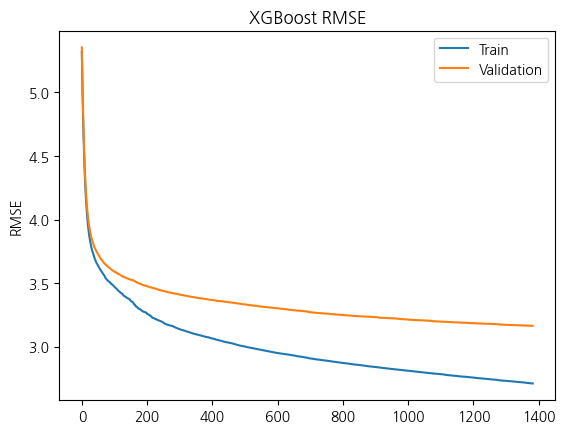

In [33]:
epochs = len(results['validation_0']['rmse'])
x_axis = range(0, epochs)

fig, ax = plt.subplots()
ax.plot(x_axis, results['validation_0']['rmse'], label='Train')
ax.plot(x_axis, results['validation_1']['rmse'], label='Validation')
ax.legend()
plt.ylabel('RMSE')
plt.title('XGBoost RMSE')
plt.show()

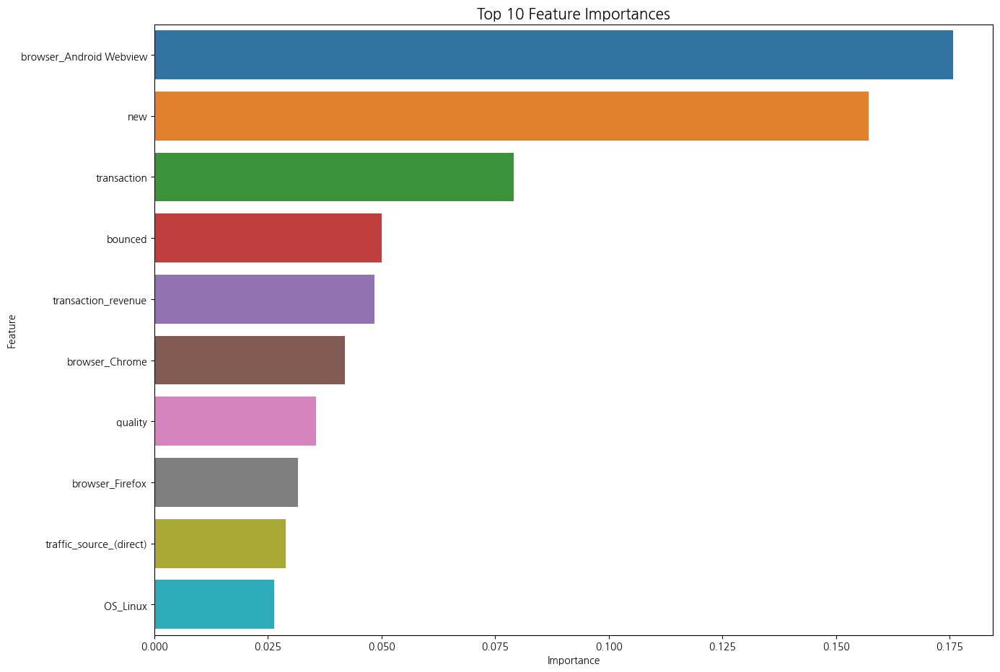

In [48]:
feature_importances = list(zip(x_train.columns, model.feature_importances_))
feature_importances.sort(key=lambda x: x[1], reverse=True)

top_features = feature_importances[:10]
top_feature_names = [x[0] for x in top_features]
top_importances = [x[1] for x in top_features]

plt.figure(figsize=(15, 11))
sns.barplot(x=top_importances, y=top_feature_names)
plt.title("Top 10 Feature Importances", fontsize=15)
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.show()

# Model Stacking
- 앙상블 기법 중 하나(보팅, 배깅, 부스팅 + 스태킹)
- 개별적인 여러 알고리즘을 사용하는 형태
- 보통 일반적으로는 잘 사용하지 않지만, kaggle과 같은 대회에서 조금이라도 성능을 올려야할때 사용

## CV(Croos Validation) 기반의 Model Stacking
- 오버피팅 방지를 위해서


In [122]:
from sklearn.model_selection import KFold
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import numpy as np

model_lgbm = LGBMRegressor(n_jobs=1,
                           verbose = 0,
                           random_state=42)

model_rf = RandomForestRegressor(n_jobs=1, 
                                 random_state=42)

model_xgb = XGBRegressor(n_jobs=1, 
                         random_state=42)

kf = KFold(n_splits=5, shuffle=True, random_state=42)

X_meta_train = np.zeros((X_train.shape[0], 3))
X_meta_val = np.zeros((X_val.shape[0], 3))

for train_index, test_index in kf.split(X_train):
    
    X_train_fold, X_val_fold = X_train[train_index], X_train[test_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[test_index]

    model_lgbm.fit(X_train_fold, y_train_fold)
    X_meta_train[test_index, 0] = model_lgbm.predict(X_val_fold)
    X_meta_val[:, 0] += model_lgbm.predict(X_val) / kf.n_splits

    model_rf.fit(X_train_fold, y_train_fold)
    X_meta_train[test_index, 1] = model_rf.predict(X_val_fold)
    X_meta_val[:, 1] += model_rf.predict(X_val) / kf.n_splits

    model_xgb.fit(X_train_fold, y_train_fold)
    X_meta_train[test_index, 2] = model_xgb.predict(X_val_fold)
    X_meta_val[:, 2] += model_xgb.predict(X_val) / kf.n_splits


model_meta = LinearRegression()
model_meta.fit(X_meta_train, y_train)

final_preds = model_meta.predict(X_meta_val)
mse = mean_squared_error(y_val, final_preds)
rmse = np.sqrt(mse)
print(f"RMSE: {rmse}")

RMSE: 2.7625702394421405


# 제출 

### 모든 train데이터를 이용하여 학습 후 제출

In [154]:
preds_lgbm = model_lgbm.predict(x_test_scaled)
preds_rf = model_rf.predict(x_test_scaled)
preds_xgb = model_xgb.predict(x_test_scaled)

X_meta_test = np.column_stack((preds_lgbm, preds_rf, preds_xgb))

y_pred_test = model_meta.predict(X_meta_test)

In [155]:
def submission():
    submission = pd.read_csv('./sample_submission.csv')
    submission['TARGET'] = y_pred_test
    submission.to_csv('./baseline_submission.csv', index=False)

In [156]:
submission()

# CatboostRegressor
- Yandex에서 개발한 오픈소스 그래디언트 부스팅 라이브러리
- 범주형 변수의 효율적 처리 -> 별도의 전처리 없이 범주형 데이터를 다룰 수 있음 (원핫인코딩등 전처리 과정 생략가능)
- 과적합에 강한 알고리즘, 기본 설정만으로 다양한 데이터셋에 강력한 성능

## 모델 학습 전 전처리

In [94]:
df_train = pd.read_parquet("./data/open/train.parquet")
df_test = pd.read_parquet("./data/open/test.parquet")
df_train = df_train.drop(['sessionID','userID'],axis=1)
df_test = df_test.drop(['sessionID','userID'],axis=1)

In [95]:
df_train.fillna('NAN', inplace=True)
df_test.fillna('NAN', inplace=True)

In [96]:
categorical_features = [
"browser",
"OS",
"device",
"continent",
"subcontinent",
"country",
"traffic_source",
"traffic_medium",
"keyword",
"referral_path",
]
for i in categorical_features:
    df_train[i] = df_train[i].astype('category')
    df_test[i] = df_test[i].astype('category')

x_train = df_train.drop('TARGET', axis=1)
y_train = df_train['TARGET']
train_pool = Pool(data=x_train, label=y_train, cat_features=categorical_features)

In [98]:
clf = CatBoostRegressor(random_state=42, verbose=False)
clf.fit(train_pool)

In [99]:
test_pool = Pool(data=df_test, cat_features=categorical_features)
pred = clf.predict(test_pool)
pred

array([27.76413837,  1.01639991,  2.67552931, ...,  2.74967538,
        4.95644313,  1.02338569])

In [100]:
pred = [0 if i < 0 else i for i in pred]

In [123]:
df_submit = pd.read_csv('./sample_submission.csv')
df_submit['TARGET'] = pred

In [124]:
df_submit.to_csv("sample_submission.csv", index=False)

# Score 정리표

![df](./image/score.png)

# 느낀점

1. 여러가지 모델에 대해서 더 자세하게 원리같은거를 공부해야할것같다.
2. 어떻게해야 오버피팅을 예방할지, 어떻게 하면 모델의 성능을 더 올릴지 많이 해봐야 경험이 쌓일것같다.
3. 앞으로 더 많은 공부가 필요할 것 같은... 부족함을 느낀 세미나였습니다 ...